# Predicting Log Error in Zillow's Zestimates

by Mariam Naqvi 

6/28/2021

## Executive Summary

The goal of this analysis is to acquire Zillow data regarding single unit properties from 2017, cleaning and analyzing it to create supervised Machine Learning models. These models were used to find drivers of errors in the Zestimate and the sales price of the property. Unsupervised Machine Learning Techniques like Clustering were utilized to boost model performance in predicting log errors.  


## Project Overview

- The tasks for my project were outlined using this [Trello board.](https://trello.com/b/eKZcBkR5/clustering-project)
- Python scripts were used to automate the process of acquiring, preparing and exploring the data
- The data was cleaned by replacing null values, dropping duplicate rows and columns, encoding new features, one hot encoding features.
    - These steps were taken to create the best performing model
- Outliers in the data beyond 1.5 IQR were removed from the dataset    
    - We removed outliers from the entire dataset, and not just the train split to improve the model's performance.
- Statistical analyses tested the following hypotheses:
    - Is Log Error significantly different across different size properties?
    - Is Log Error significantly different across different counties?
    - Is Log Error significantly different for homes with more than 6 bathrooms?
    - Is Log Error significantly different for homes with more than 5 bedrooms?
- The data was split into train, test and split dataframes before modeling to avoid data leakage and maintain data integrity
- The elbow method was utilized to find the optimum number of clusters (k) to create for each set of features.
- The following clusters were created:
    - CLuster 1: bathroomcnt, bedroomcnt, calculatedfinishedsquarefeet, age_of_home, buildingqualitytypeid
    - Cluster 2: structuretaxvaluedollarcnt, taxvaluedollarcnt, landtaxvaluedollarcnt, taxamount
    - Cluster 3: bathroomcnt, taxvaluedollarcnt, calculatedfinishedsquarefeet
- Recursive feature enlimination was utilized to select the top 7 features to be included in the models used to predict log error.
- Since our target variable, Log Error, is continuous, we used the following regression algorithms to create models with the intention of beating the baseline:
    - OLS Regression
    - Lasso + Lars
    - Tweedie Regressor GLM
    - Polynomial Regression
- For the purposes of this analysis, we assumed all conditions of Linear Regression were met.
- The best model was fitted on the test data to predict property values


## Key Takeaways

- The square footage, tax values, county and types 1 and 2 of cluster 3 were found to be the best drivers of log error. 
- Most variables like number of bedrooms and bathrooms were highly correlated with each other and had low correlation with that target.
- There were many outliers especially in the tax variables indicating some premium properties were part of the dataset.
    - These outliers were removed from the dataset to achieve more normal distributions for our analysis and help train the models better.
- A Standard Scaler was applied to the X variables in the train, validate and test splits.
- The baseline median's RMSE of 0.158350 was utilized as the RMSE to beat
- All models beat this RMSE by a small margin
- The Root Mean Squared Error (RMSE) and R squared were utilized as metrics to evaluate each model's performance
    - RMSE was utilized since we are comparing different size datasets
    - R squared was utilized to evaluate the variance in the model explained by our models
- My best model used OLS Linear Regression and had RMSE of 0.157616 and R squared of 0.003644 on the validate splits. While this beat the median baseline, the R-squared value is very low.
- The model's performance decreased slightly on out of sample data to an RMSE of  0.162519 and R squared of 0.000142 on the test split


## Data Dictionary
- You can find the data dictionary detailing all the variables used and created [here.](https://github.com/mariamnaqvi/predicting-log-error)

In [2]:
# Imports to utilize throughout the notebook

import pandas as pd
import numpy as np
import env
# visualization imports
import matplotlib.pyplot as plt
import seaborn as sns

# custom module imports
import acquire as aq
import prepare as pr
import explore as ex

# feature selection imports
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.feature_selection import RFE

# import scaling methods
from sklearn.preprocessing import RobustScaler, StandardScaler
from scipy import stats

# import modeling methods
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression, LassoLars, TweedieRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import explained_variance_score

# import to remove warnings
import warnings
warnings.filterwarnings("ignore")

# Acquire Data

The data was acquired from the Codeup database using the following SQL query. The goal was to focus only on single unit properties. For this analysis, a single unit property is defined as a **housing unit within a larger structure that can be used by an individual or household to eat, sleep, and live. The unit can be in any type of residence, such as a house, apartment, or mobile home, and may also be a single unit in a group of rooms.**

Latitude and Longitude were filtered to remove nulls and property land use types to only include single unit properties with transactions in 2017.

    SELECT * 
    FROM predictions_2017 pred
            LEFT JOIN properties_2017 USING(parcelid)
            LEFT JOIN airconditioningtype USING(airconditioningtypeid)
            LEFT JOIN architecturalstyletype USING(architecturalstyletypeid)
            LEFT JOIN buildingclasstype USING(buildingclasstypeid)
            LEFT JOIN heatingorsystemtype USING(heatingorsystemtypeid)
            LEFT JOIN propertylandusetype USING(propertylandusetypeid)
            LEFT JOIN storytype USING(storytypeid)
            LEFT JOIN typeconstructiontype USING(typeconstructiontypeid)
    WHERE pred.transactiondate LIKE '2017%'
    AND latitude IS NOT NULL
    AND longitude IS NOT NULL
    AND propertylandusetypeid IN (261, 263, 264, 265, 266, 268, 273, 275, 276, 279);

In [3]:
# acquiring the zillow data into a dataframe
df = aq.get_zillow_data()

In [3]:
# set to display all rows and columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
# quick look at data acquired and the columns
df.head()

,typeconstructiontypeid,storytypeid,propertylandusetypeid,heatingorsystemtypeid,buildingclasstypeid,architecturalstyletypeid,airconditioningtypeid,parcelid,id,logerror,...,taxdelinquencyflag,taxdelinquencyyear,censustractandblock,airconditioningdesc,architecturalstyledesc,buildingclassdesc,heatingorsystemdesc,propertylandusedesc,storydesc,typeconstructiondesc
0,NaN,NaN,261.0,NaN,None,NaN,NaN,14297519,0,0.025595,...,None,NaN,6.059063e+13,None,None,None,None,Single Family Residential,None,None
1,NaN,NaN,261.0,NaN,None,NaN,NaN,17052889,1,0.055619,...,None,NaN,6.111001e+13,None,None,None,None,Single Family Residential,None,None
2,NaN,NaN,261.0,NaN,None,NaN,NaN,14186244,2,0.005383,...,None,NaN,6.059022e+13,None,None,None,None,Single Family Residential,None,None
3,NaN,NaN,261.0,2.0,None,NaN,NaN,12177905,3,-0.103410,...,None,NaN,6.037300e+13,None,None,None,Central,Single Family Residential,None,None
4,NaN,NaN,266.0,2.0,None,NaN,1.0,10887214,4,0.006940,...,None,NaN,6.037124e+13,Central,None,None,Central,Condominium,None,None


In [4]:
# summarize the df and its columns
aq.summarize(df)

The zillow dataframe has 72257 rows and 69 columns.

-------------------
There are total of 2382760 missing values in the entire dataframe.

-------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72257 entries, 0 to 72256
Data columns (total 69 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   typeconstructiontypeid        223 non-null    float64
 1   storytypeid                   50 non-null     float64
 2   propertylandusetypeid         72257 non-null  float64
 3   heatingorsystemtypeid         46685 non-null  float64
 4   buildingclasstypeid           0 non-null      object 
 5   architecturalstyletypeid      207 non-null    float64
 6   airconditioningtypeid         23075 non-null  float64
 7   parcelid                      72257 non-null  int64  
 8   id                            72257 non-null  int64  
 9   logerror                      72257 non-null  float64
 10  transactiondate  

In [5]:
# summary stats for numeric columns in the data
df.describe().T

,count,mean,std,min,25%,50%,75%,max
typeconstructiontypeid,223.0,6.040359e+00,5.560348e-01,4.000000e+00,6.000000e+00,6.000000e+00,6.000000e+00,1.300000e+01
storytypeid,50.0,7.000000e+00,0.000000e+00,7.000000e+00,7.000000e+00,7.000000e+00,7.000000e+00,7.000000e+00
propertylandusetypeid,72257.0,2.623707e+02,2.247760e+00,2.610000e+02,2.610000e+02,2.610000e+02,2.660000e+02,2.750000e+02
heatingorsystemtypeid,46685.0,3.952105e+00,3.657151e+00,1.000000e+00,2.000000e+00,2.000000e+00,7.000000e+00,2.400000e+01
architecturalstyletypeid,207.0,7.386473e+00,2.728030e+00,2.000000e+00,7.000000e+00,7.000000e+00,7.000000e+00,2.100000e+01
airconditioningtypeid,23075.0,1.867346e+00,3.062472e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.300000e+01
parcelid,72257.0,1.306534e+07,3.441400e+06,1.071186e+07,1.154043e+07,1.258776e+07,1.427122e+07,1.676885e+08
id,72257.0,3.883443e+04,2.238216e+04,0.000000e+00,1.945800e+04,3.886200e+04,5.821100e+04,7.761200e+04
logerror,72257.0,1.696921e-02,1.689795e-01,-4.655420e+00,-2.365924e-02,6.672268e-03,3.856557e-02,5.262999e+00
id,72257.0,1.495789e+06,8.605417e+05,3.490000e+02,7.542260e+05,1.500094e+06,2.240184e+06,2.982274e+06


### Acquire Takeaways
- The dataframe has a nice set of observations and not too many columns
- Log Error is our target variable
- There are a bunch of null values which we will explore and decide how to handle
- parcel id and other id columns do not provide much information except serving as unique id
    - These columns were required for acquisition
- We will not drop unnecessary columns as we plan to use only select features in our models
- Most variables are numeric
    - There are some descriptive variables that have object dtypes
    - These variables will be changed to numeric if they will be used in the models
- FIPS County codes can be dummy coded because there are 3 categories
- Encode yearbuilt as age of home to make it a continuous variable
- Median year built is 1970
- Newest home was built in 2016 while the oldest home is from 1878
- Average number of baths is around 2
- Average number of beds is around 3
- Min number of beds and baths is 0
    - 0 beds could be a studio but 0 baths is likely an error that will be further explored
- Mean home size is around 1700 square feet
- Average Log Error is around 0.017
- Min Log Error is -4.65 and max log error is 5.26

# Prepare Data

During this phase of the pipeline, the main focus was on cleaning and preparing the data for analysis and modeling. 

Functions from my prepare script were utilized to perform the following actions:

- handle missing values above a specified threshold
- dropping duplicate rows and columns
- removing properties with 0 beds and 0 baths as well as 0 square footage
- replacing null values in `yearbuilt` with median yearbuilt
- encoding `yearbuilt` as `age_of_home`
- One hot encoding the `county` column to 3 different columns, 1 for each county
- removing outliers beyond 1.5 IQR from the original df
- Splitting the dataframe into train, test and split tests
- imputing missing values in the train split using strategies of meost frequent and median
- scaling X variables before modeling using a standard scaler


In [4]:
df = pr.prep_zillow(df)

There are no duplicate rows in your dataset.
----------------
The following 34 columns were dropped because they were missing more than 60.0% of data: 
['typeconstructiontypeid', 'storytypeid', 'buildingclasstypeid', 'architecturalstyletypeid', 'airconditioningtypeid', 'basementsqft', 'decktypeid', 'finishedfloor1squarefeet', 'finishedsquarefeet13', 'finishedsquarefeet15', 'finishedsquarefeet50', 'finishedsquarefeet6', 'fireplacecnt', 'garagecarcnt', 'garagetotalsqft', 'hashottuborspa', 'poolcnt', 'poolsizesum', 'pooltypeid10', 'pooltypeid2', 'pooltypeid7', 'regionidneighborhood', 'threequarterbathnbr', 'yardbuildingsqft17', 'yardbuildingsqft26', 'numberofstories', 'fireplaceflag', 'taxdelinquencyflag', 'taxdelinquencyyear', 'airconditioningdesc', 'architecturalstyledesc', 'buildingclassdesc', 'storydesc', 'typeconstructiondesc']

167 rows were dropped because they were missing more than 75.0% of data


In [5]:
# removing outliers from the df
outlier_cols = ['calculatedfinishedsquarefeet','lotsizesquarefeet', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt',
       'landtaxvaluedollarcnt', 'taxamount']

df = pr.remove_outliers(df, outlier_cols, 1.5)

# Explore Data

### Exploring Univariate Distributions
The explore_univariate function from my explore script is used to create bar plots for categorical variables and histograms and boxplot for continuous variables.

In [6]:
# selecting categorical and continuous columns to use in the explore functions
cat_vars = ['bathroomcnt', 'bedroomcnt', 'buildingqualitytypeid', 'fips', 'LA_county', 'orange_county', 'ventura_county']

cont_vars = ['logerror', 'calculatedfinishedsquarefeet', 'latitude', 'longitude', 'lotsizesquarefeet', 'yearbuilt', 
            'structuretaxvaluedollarcnt', 'taxvaluedollarcnt', 'landtaxvaluedollarcnt', 'taxamount', 'age_of_home']

Bar Plot of bathroomcnt


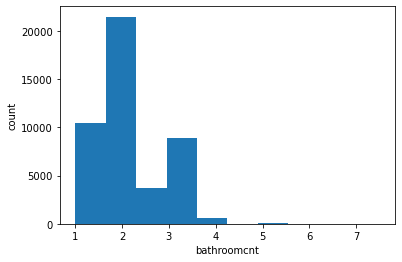

Bar Plot of bedroomcnt


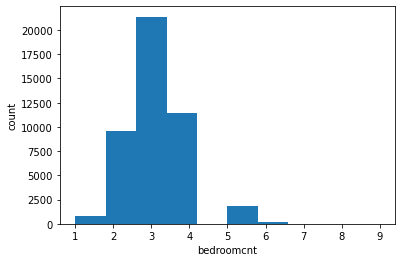

Bar Plot of buildingqualitytypeid


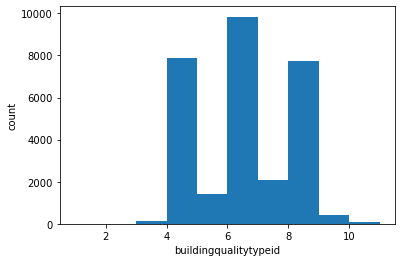

Bar Plot of fips


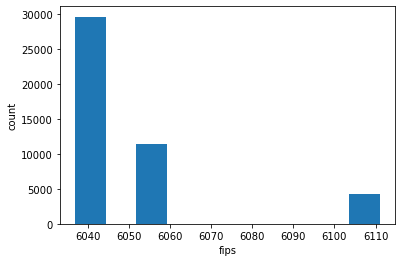

Bar Plot of LA_county


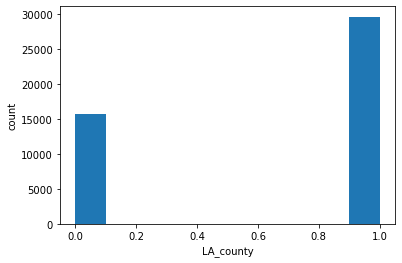

Bar Plot of orange_county


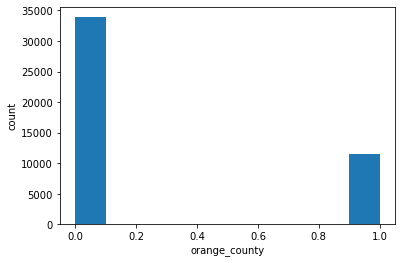

Bar Plot of ventura_county


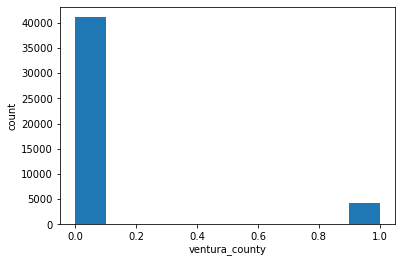

Distribution of logerror


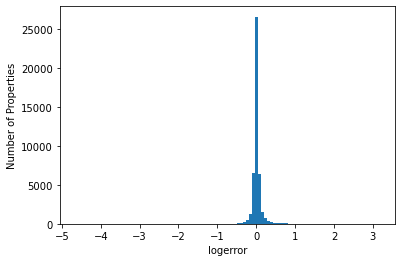

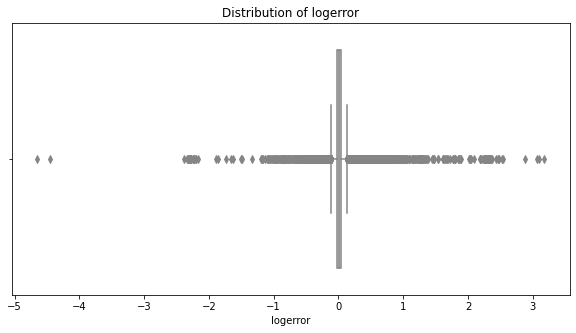

Distribution of calculatedfinishedsquarefeet


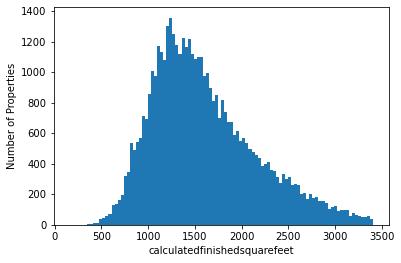

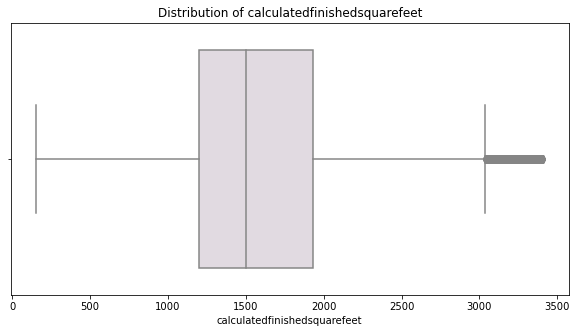

Distribution of latitude


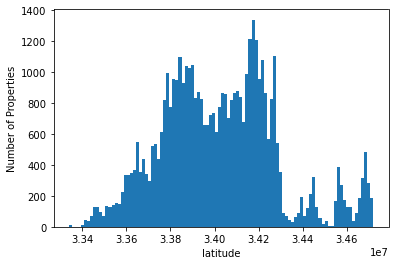

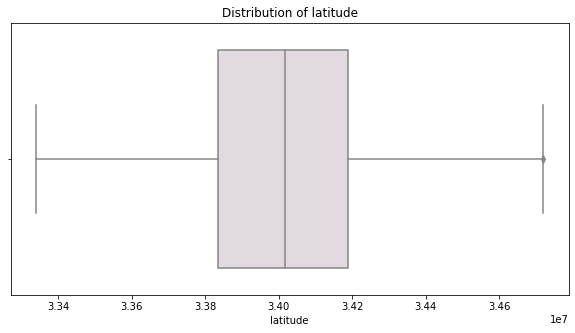

Distribution of longitude


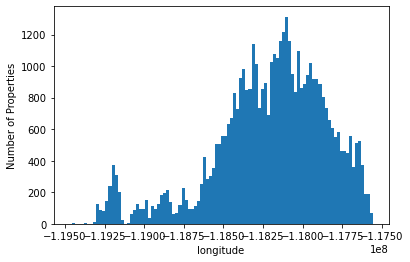

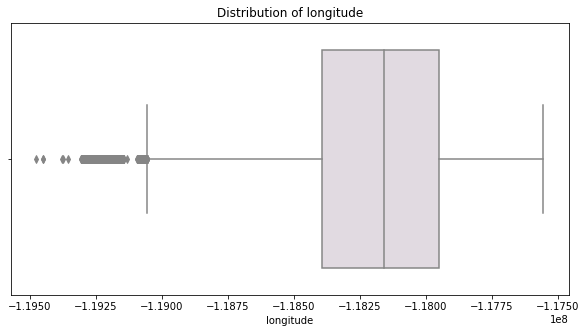

Distribution of lotsizesquarefeet


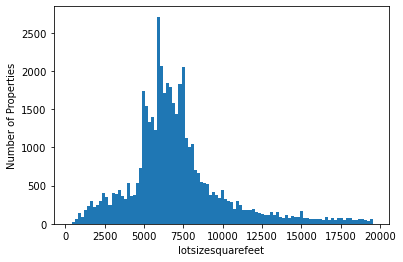

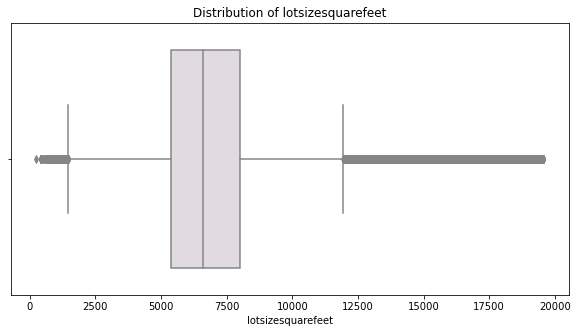

Distribution of yearbuilt


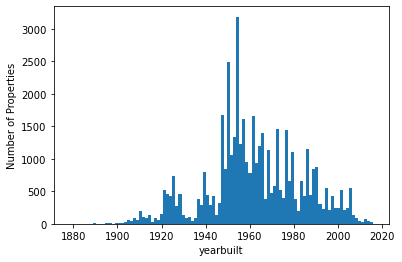

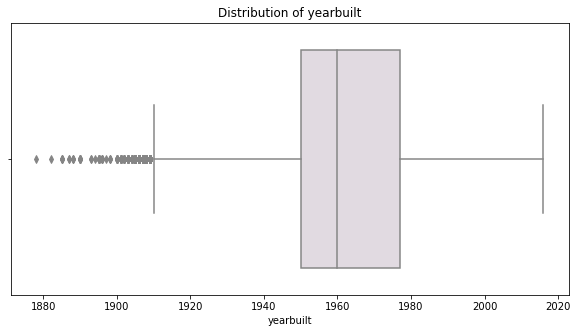

Distribution of structuretaxvaluedollarcnt


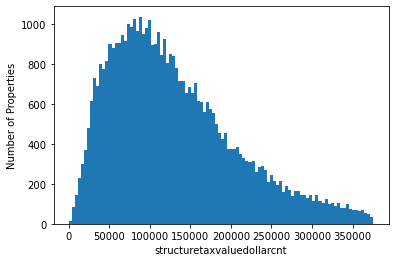

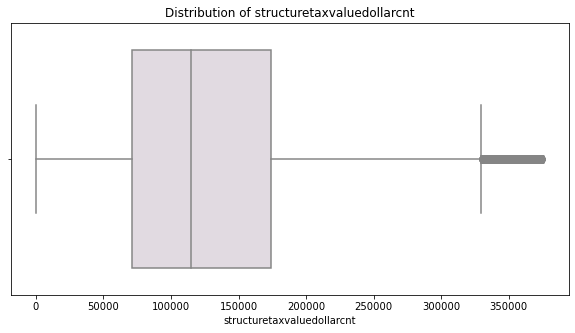

Distribution of taxvaluedollarcnt


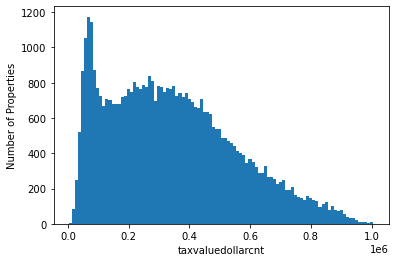

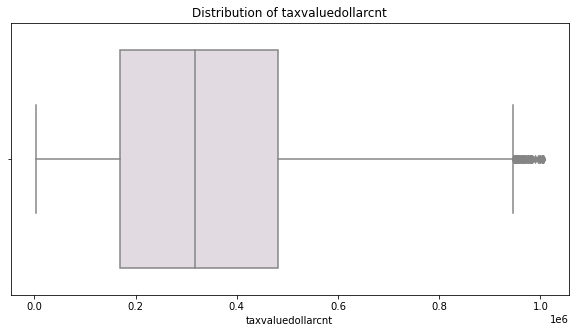

Distribution of landtaxvaluedollarcnt


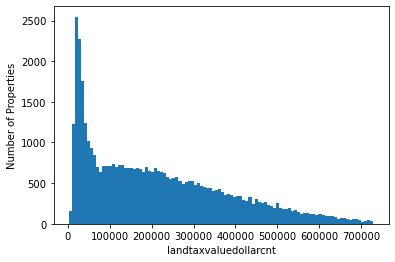

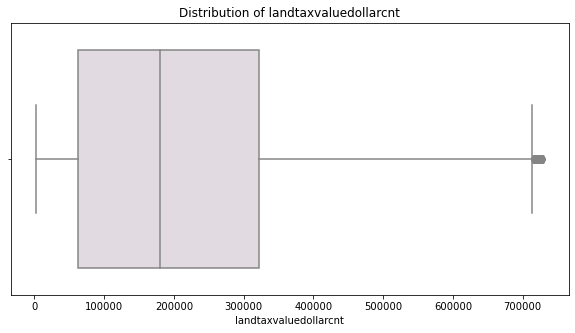

Distribution of taxamount


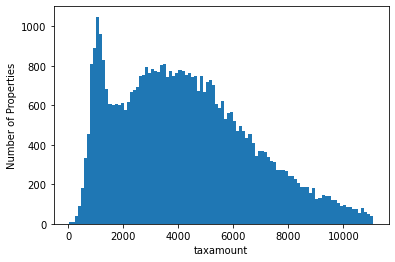

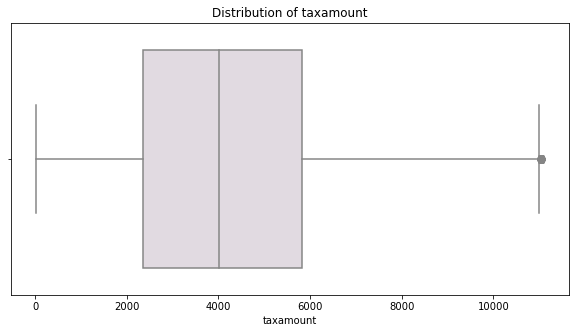

Distribution of age_of_home


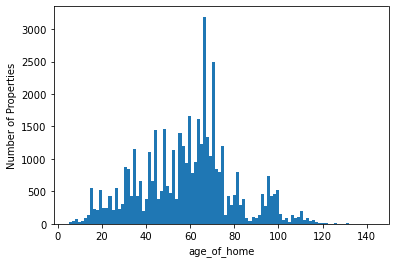

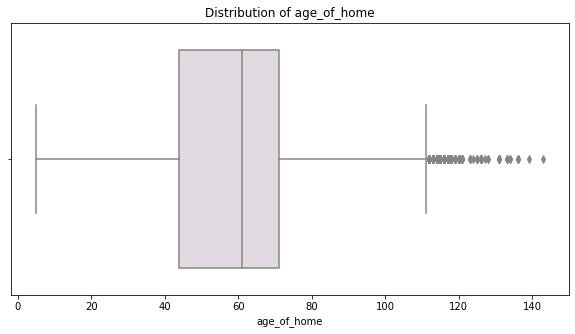

In [10]:
# call the function to plot visualizations for univariate exploration
ex.explore_univariate(df, cat_vars, cont_vars)


### Univariate Takeaways


- Most properties have 2.5baths and 3 beds
- Most common buildingqualitytype is 8 followed by 6
- Most data from properties in county 6037
- Fewest homes in Ventura County
- Log error is normally distributed
- These distributions are being visualized after removing outliers to help achieve more normal distributions
- `age_of_home`,`taxamount`,`landtaxvaluedollarcnt', structuretaxvaluedollarcnt still have some upper outliers causing their distributions to be slightly right skewed
- yearbuilt has lower outliers and a left skewed distribution
- Latitude seems roughly normally distirbuted
- Longitude is left skewed with some lower outliers
- `calculatedfinishedsquarefeet` has upper outliers but is roughly normally distributed
- lotsizesquarefeet has upper outliers but looks roughly normally distributed
- Most homes were built after 1950
- `yearbuilt` has some lower outliers while `age_of_home` has some upper outliers

## Splitting the dataframe 

The original dataframe will be split using a random seed into train, validate and test splits. This is performed to avoid data leakage in the models and to maintain data integrity. All bivariate and multivariate exploration as well as imputation of missing values will be performed only on the training split. The proportions of the splits will be as follows:

- Train: 56%
- Validate: 24%
- Test: 20%


In [8]:
# split the df
train, validate, test = pr.split_zillow(df)

Shape of train split: (25379, 38)
----------------
Shape of test split: (10878, 38)
----------------
Shape of validate split: (9065, 38)
----------------


- The splits have different rows but the same number of columns which is what we are looking for.

In [12]:
# imputing continuous columns with median value
train = pr.impute(train, 'median', ['buildingqualitytypeid','yearbuilt','finishedsquarefeet12', 'lotsizesquarefeet', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt', 'landtaxvaluedollarcnt', 'taxamount'])


In [13]:
# # imputing categorical colummns with most frequent imputer strategy
cat_cols = ['calculatedbathnbr','fullbathcnt', 'regionidcity', 'regionidzip',
       'censustractandblock']
    
train = pr.impute(train, 'most_frequent', 
        cat_cols)

In [14]:
# mean log error
train.logerror.mean()

0.016694728323979776

## Exploring Bivariate Relationships

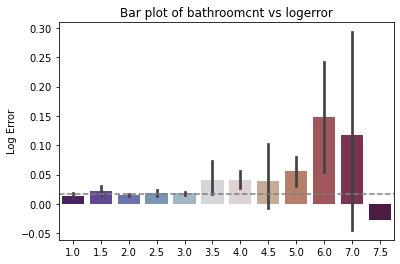

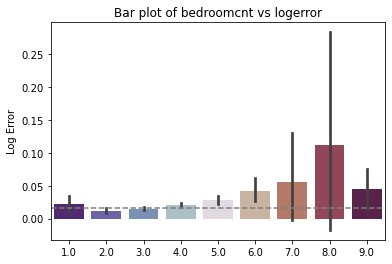

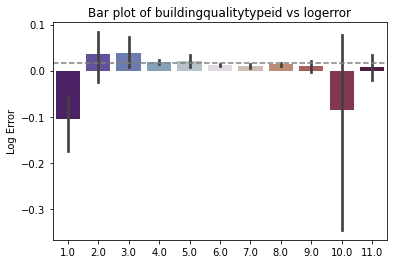

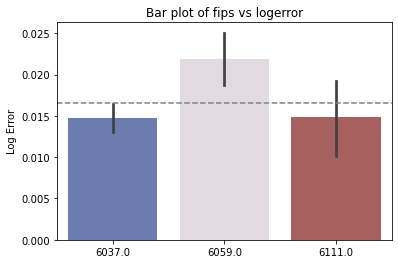

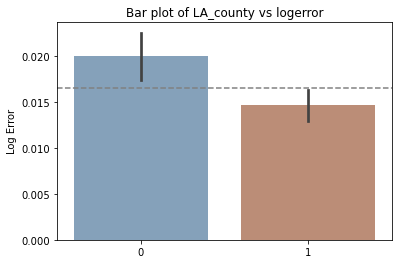

...

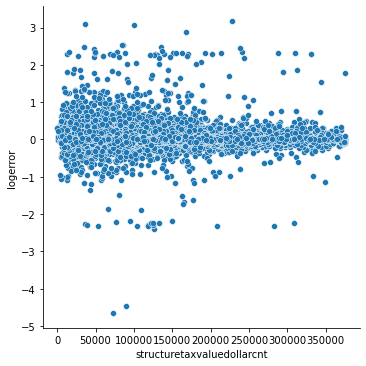

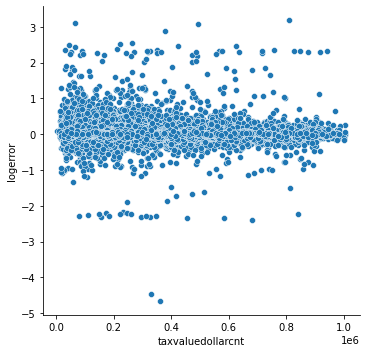

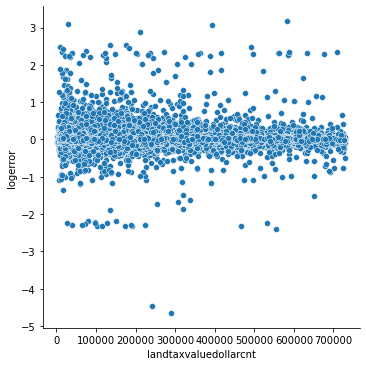

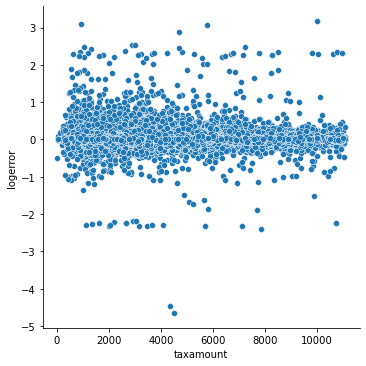

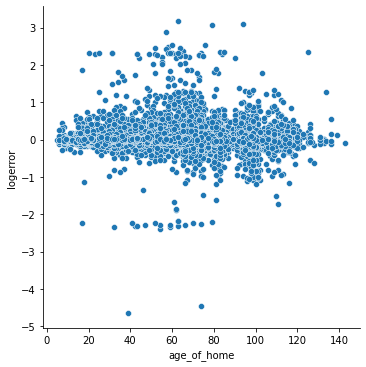

In [11]:
# call bivariate function from explore script to plot viz
ex.explore_bivariate(df, 'logerror', cat_vars, cont_vars)



### Bivariate Takeaways

- log error increases after 3 bathrooms until 6 then begins to reduce
- highest log error for 6 bathrooms
- log error increases until 8 bathrooms then begins to reduce
- log error below 0 for building quality 1 and 10, pretty uniform between 4 and 9
- mean log error is 0.016695
- log error above average in LA county and below average in other counties
- latitude and longitde show increasing spread until a point and then reducing spread of log error
- log error spread is fairly unirform after 10,000 lotsize sq feet
- log error spread is higher under 2000 sqft
- for yearbuilt, spread of log error is highest for properties built between 1950 -1970
- generally for tax variables, spread of log error reduces as tax values increase beyond a certain point
    - For example, log error spread reduces for tax amount over 6000
- spread of log error reduces after 80 years age of properties


## Exploring Multivariate Interactions

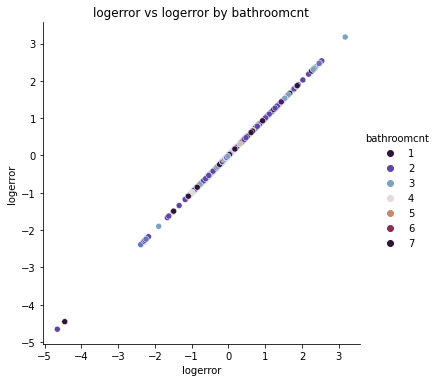

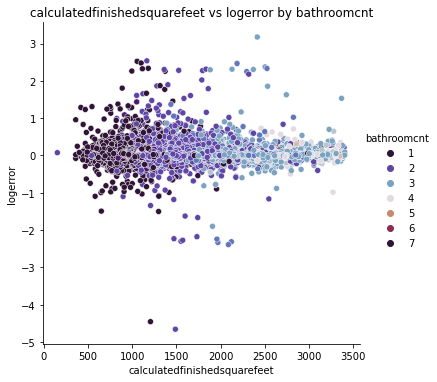

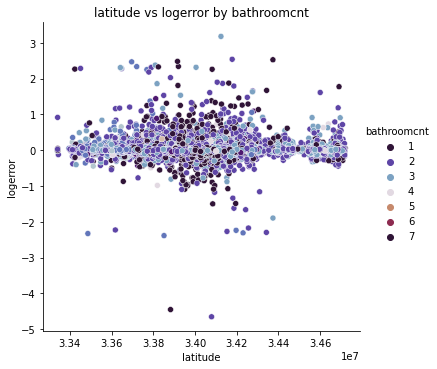

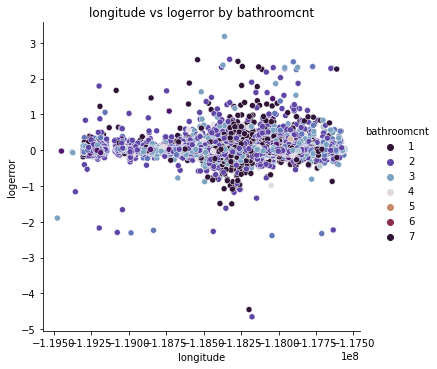

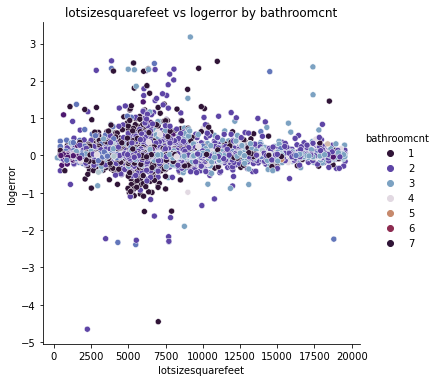

...

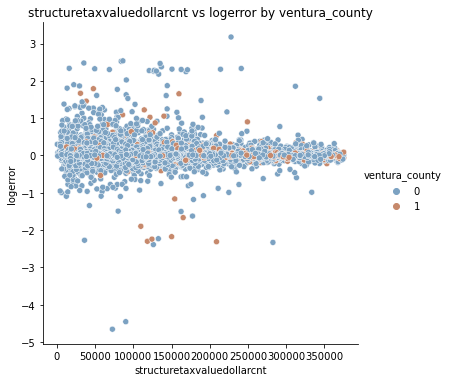

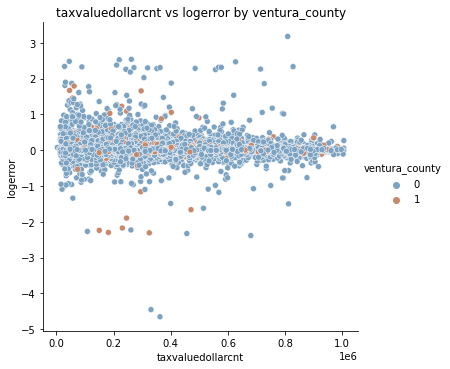

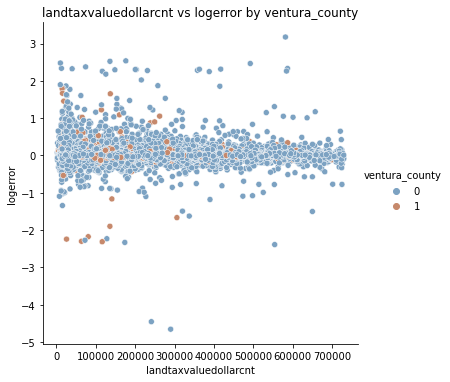

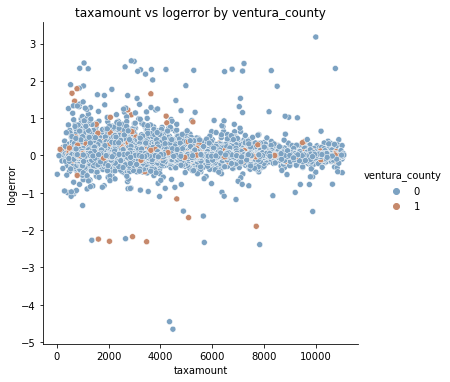

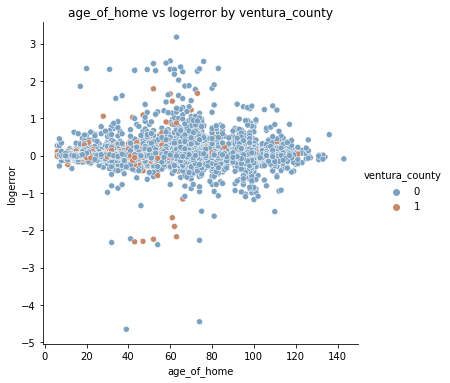

In [20]:
# call function from explore script to plot viz
ex.explore_multivariate(train, 'logerror', cat_vars, cont_vars)

### Multivariate Takeaways

- Greater spread of log errors are roughly under 3000 sq ft
- As square footage increases beyond 5000, log error reudces
- Greater spread of log error till 3.44 latitude and the spread sharply reduces after 3.44 latitude
- Greater spread of log error after -1.185 longitude
- Log error is concentrated around the smallest sizes for lot size sqft
    - As the lot size increases, the spread of log error reduces
- As tax values increase, the spread of log error reduces


## Possible questions to ask 

- Is there a relationship between sqfootage and log error?
- Is log error higher in orange county vs la county?
- Is log error significantly different for properties with more than 6 bathrooms?
- Is log error significantly different for properties with more than 5 bedrooms?

### 1. Is Log Error significantly different across different size properties?

Based on the scatteplot in our bivariate exploration, it looks like the spread of log error is higher for properties under 2000 square feet.

We can also visualize the relationship between square footage and absolute log error to avoid any negative values since `calculatedfinishedsquarefeet` does not have any negative values. There does not seem to be a linear relationship between log error and square footage since the regression line is almost flat. We can further explore the relationship by binning the values.

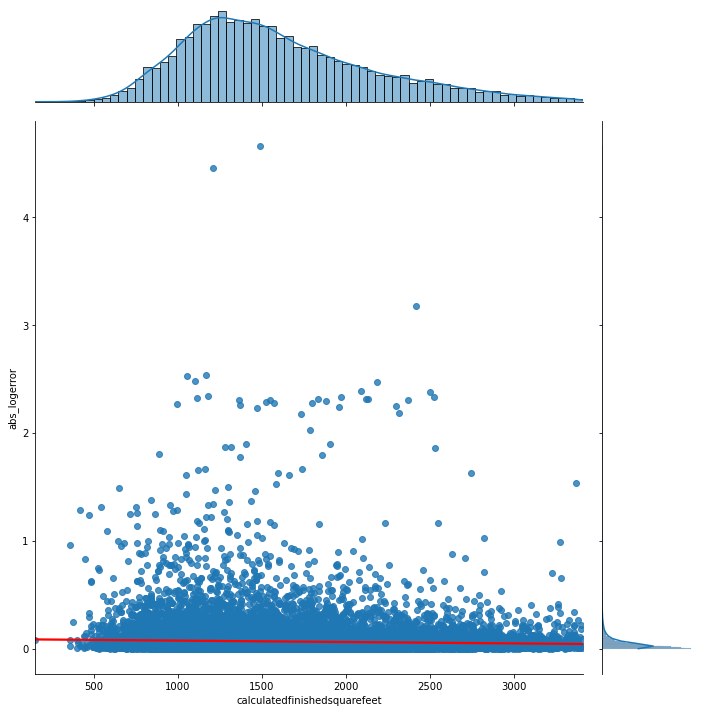

In [9]:
# Create a new column for only positive log error values
train['abs_logerror'] = abs(train.logerror) 

# creates scatterplot with red regression line and distributions on top
sns.jointplot(height = 10, x="calculatedfinishedsquarefeet", y="abs_logerror", data=train, kind='reg',
                  joint_kws={'line_kws':{'color':'red'}}) 
plt.show()

In [26]:
# look at summary stats for square footage to decided which bins to create
train.calculatedfinishedsquarefeet.describe()

count    25379.000000
mean      1601.577604
std        557.132513
min        152.000000
25%       1196.000000
50%       1498.000000
75%       1924.000000
max       3410.000000
Name: calculatedfinishedsquarefeet, dtype: float64

Text(0, 0.5, 'Log Error')

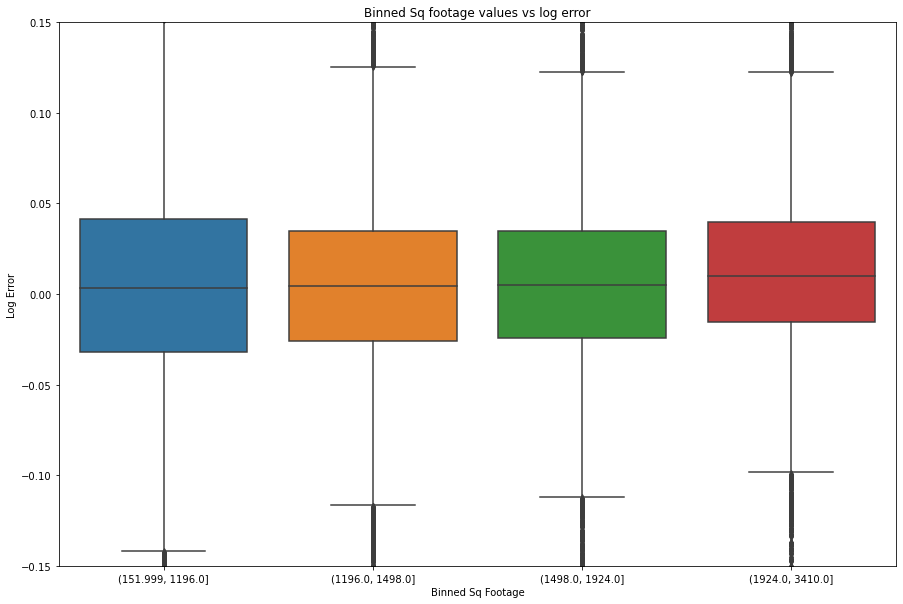

In [10]:
# create 4 bins
train['value_bins'] = pd.qcut(train['calculatedfinishedsquarefeet'], q=4) 

plt.figure(figsize=(15, 10))

# limit y for better viz
plt.ylim(-.15, .15)

sns.boxplot(data=train, x='value_bins', y='logerror')
plt.title('Binned Sq footage values vs log error')
plt.xlabel('Binned Sq Footage')
plt.ylabel('Log Error')

- While the median log error for all bins seem quite similar and around 0, the IQR of bin 1 is higher than others. We can confirm that through statistical testing. Since our target of log error is normally distributed we can use a t-test.

In [11]:
# look at summary stats of the binned values
train.groupby('value_bins').logerror.describe()

,count,mean,std,min,25%,50%,75%,max
value_bins,,,,,,,,
"(151.999, 1196.0]",6358.0,0.019477,0.178599,-1.491163,-0.032165,0.003479,0.041248,2.536896
"(1196.0, 1498.0]",6348.0,0.013270,0.162838,-4.655420,-0.025959,0.004638,0.034677,2.304484
"(1498.0, 1924.0]",6338.0,0.013447,0.141650,-2.298627,-0.024327,0.004949,0.034493,2.314968
"(1924.0, 3410.0]",6335.0,0.020583,0.149796,-2.387800,-0.015718,0.009924,0.039570,3.175688


- As expected, the median of the other 3 bins are similar in value and the last bin has the highest median as well as the mean
- Bin 4 also has the highest max log error values among all the bins
- Lowest minimum log error is for bin 2
- we can confirm our visualizations using statistical testing

#### Levene's test for equal variances

alpha = 0.05

$H_{0}$: Variance in logerror for homes with 2064 sqft or less is equivalent to those with more than 2064 sqft

$H_{a}$: Variance in logerror for homes with 2064 sqft or less is not equivalent to those with more than 2064 sqft

In [29]:
stats.levene(train[train.calculatedfinishedsquarefeet > 2064].logerror, train[train.calculatedfinishedsquarefeet <= 2064].logerror)


LeveneResult(statistic=15.385835605146063, pvalue=8.787341742456818e-05)

- Since the p-value is less than our alpha of 0.05, we will reject the null hypothesis and proceed with the presumption of inequal variance.

#### Independent t-test (2 samples)

For a 1-tailed test where our alternative hypothesis is testing for "greater than", we evaluate 𝑝/2 < 𝛼 and 𝑡 > 0.

- Setting Hypothesis

$H_{0}$: Mean logerror for homes with 2064 sqft or less is equivalent to those with more than 2064 sq ft 

$H_{a}$: Mean logerror for homes with 2064 sqft or less is greater than those with more than 2064 sq ft 

- Verify assumptions

Normal distribution


In [33]:
stats.ttest_ind(train[train.calculatedfinishedsquarefeet > 2064].logerror, train[train.calculatedfinishedsquarefeet <= 2064].logerror)


Ttest_indResult(statistic=3.2987078245779236, pvalue=0.0009726459550778443)

- Since our p/2 value is less than alpha of 0.05 we can reject the null hypothesis and say that there is a significant difference in the mean logerror in homes with more than 2064 sqft compared to those with equal to or less than 2064 sq feet.
- After statistical analysis, we can say that at least one of the bins is significantly different from the other so there might be value in creating clusters using `calculatedfinishedsquarefeet`.

### 2. Is Log Error significantly different across different counties?

In [34]:
# distribution of counties in the train split
train.fips.value_counts()

6037.0    16643
6059.0     6405
6111.0     2331
Name: fips, dtype: int64

In [12]:
# add a new county column with the name of the counties instead of their fips codes
train['county'] = train.fips.apply(lambda x: 'orange' if x == 6059.0 else 'los_angeles' if x == 6037.0 else 'ventura')

In [36]:
train.county.value_counts()

los_angeles    16643
orange          6405
ventura         2331
Name: county, dtype: int64

- Most properties in our split are located in LA or Orange counties
- Based on the countplot visualized above, it looks like LA county has the highest log error while the other counties seem to have a similar log error. 
    - This will be verified through statistical testing. 

#### Levene's test for equal variances

alpha = 0.05

$H_{0}$: Variance in logerror in Los Angeles county and other counties are equivalent

$H_{a}$: Variance in logerror in Los Angeles county and other counties are not equivalent

In [37]:
stats.levene(train[train.county == 'los_angeles'].logerror, train[train.county != 'los_angeles'].logerror)

LeveneResult(statistic=48.898199427119486, pvalue=2.7627904661461266e-12)

- Since the p-value is less than our pre set alpha of 0.05, we will reject the null hypotheis and proceed with the presumption of inequal variance.

#### Independent t-test (2 samples)

For a 1-tailed test where our alternative hypothesis is testing for "greater than", we evaluate 𝑝/2 < 𝛼 and 𝑡 > 0.

- Setting Hypothesis

$H_{0}$: Mean logerror in Los Angeles County is equivalent to Mean Error of other counties

$H_{a}$: Mean logerror in Los Angeles County is higher than the Mean Error of other counties

- Verify assumptions

Normal distribution

In [39]:
t, p = stats.ttest_ind(train[train.county == 'los_angeles'].logerror, train[train.county != 'los_angeles'].logerror, equal_var=False)


- Since p/2-value is less than alpha of 0.05, we can reject the null hypothesis and say that the mean log error for LA county is significantly higher than that of other counties. 
- We will now check if the log error of Orange and Ventura counties is significantly different from each other.

#### Levene's test for equal variances

alpha = 0.05

$H_{0}$: Variance in logerror in Orange county and Ventura county are equivalent

$H_{a}$: Variance in logerror in Orange county and Ventura county are not equivalent

In [41]:
stats.levene(train[train.county == 'orange'].logerror, train[train.county == 'ventura'].logerror)

LeveneResult(statistic=0.42040479648782275, pvalue=0.5167521734626526)

- Since p- value is higher than alpha of 0.05, we fail to reject the null and proceed with the presumption of equal variances.

#### Independent t-test (2 samples)

For a 2-tailed test where our alternative hypothesis is testing for "equal to", we evaluate 𝑝 < 𝛼 and 𝑡 > 0.

- Setting Hypothesis

$H_{0}$: Mean logerror in Orange County is equivalent to Mean Error of Ventura county

$H_{a}$: Mean logerror in Orange County is not equivalent to Mean Error of Ventura county

- Verify assumptions

Normal distribution

In [42]:
stats.ttest_ind(train[train.county == 'orange'].logerror, train[train.county == 'ventura'].logerror, equal_var=True)


Ttest_indResult(statistic=1.6365774194612657, pvalue=0.10175482588936005)

- Since p- value is higher than alpha of 0.05, we fail to reject the null and proceed with saying that there is not a significant difference in mean log error between orange and ventura counties.
- Since the log error of these 2 counties is not significantly different from each other and only LA county is significantly different, we will not include counties in clustering.

### 3. Is Log Error significantly different for homes with more than 3 bathrooms?

Text(63.0, 0.5, 'Absolute Log Error')

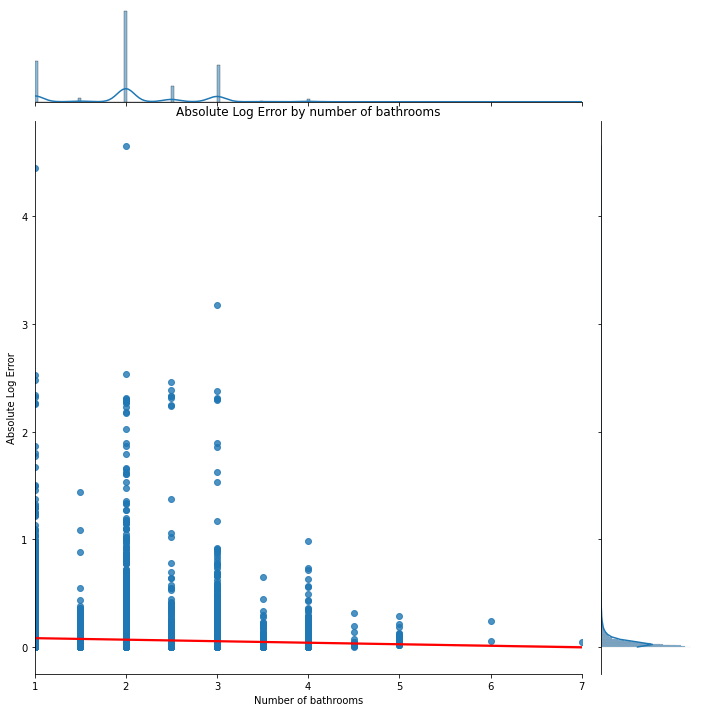

In [43]:
# visualize absolute log error vs bathroomcnt
sns.jointplot(height = 10, x="bathroomcnt", y="abs_logerror", data=train, kind='reg',
                  joint_kws={'line_kws':{'color':'red'}}) 
plt.title('Absolute Log Error by number of bathrooms')
plt.xlabel('Number of bathrooms')
plt.ylabel('Absolute Log Error')

- The regression line does not show any linear correlation. There don't seem to be very distinct clusters either. However, from the scatterplot, it looks like the absolute log error is lower for properties with more than 3 bathrooms. we will run statistical tests to confirm this.

#### Levene's test for equal variances

alpha = 0.05

$H_{0}$: Variance in logerror in properties with more than 3 bathrooms and others are equivalent

$H_{a}$: Variance in logerror in properties with more than 3 bathrooms and others are not equivalent

In [46]:
stats.levene(train[train.bathroomcnt > 3].logerror, train[train.bathroomcnt <= 3].logerror)

LeveneResult(statistic=0.4355516955284685, pvalue=0.5092833034390162)

- Since the p-value is not less than our alpha of 0.05, we fail to reject the null hypothesis and proceed with the presumption that variances are equal. 

#### Independent t-test (2 samples)

For a 2-tailed test where our alternative hypothesis is testing for "equal to", we evaluate 𝑝 < 𝛼 and 𝑡 > 0.

- Setting Hypothesis

$H_{0}$: Mean logerror for properties with more than 3 bathrooms is equivalent to those with 3 or less bathrooms

$H_{a}$: Mean logerror  for properties with more than 3 bathrooms is not equal to those with 3 or less bathrooms

- Verify assumptions

Normal distribution

In [48]:
t, p = stats.ttest_ind(train[train.bathroomcnt > 3].logerror, train[train.bathroomcnt <= 3].logerror, equal_var=False)


- Since the p-value is less than alpha, we can reject the null hypothesis and say that the log error for properties with more than 3 bathrooms is signficantly different than those with less than 3 bathrooms.
- Based on statistical testing, bathroomcnt would be good to include in clusters to further explore its effects and interactions with other features.

### 4. Is Log Error significantly different for homes with more than 5 bedrooms?

Text(63.0, 0.5, 'Absolute Log Error')

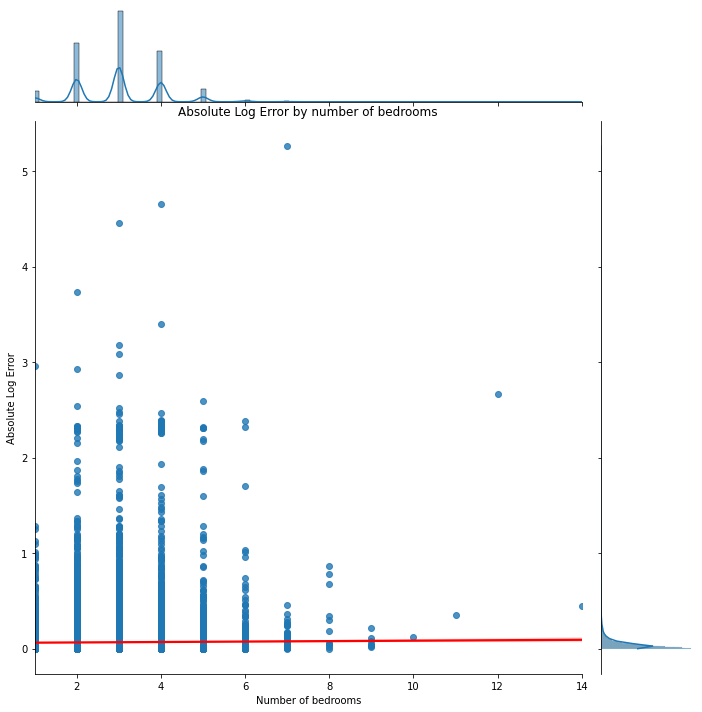

In [48]:
# visualize absolute log error vs bedroomcnt
sns.jointplot(height = 10, x="bedroomcnt", y="abs_logerror", data=train, kind='reg',
                  joint_kws={'line_kws':{'color':'red'}}) 
plt.title('Absolute Log Error by number of bedrooms')
plt.xlabel('Number of bedrooms')
plt.ylabel('Absolute Log Error')

- Based on the jointplot above, it looks like the log error reduces after 5 bedrooms. 
- We will confirm this with statistical testing.

#### Levene's test for equal variances

alpha = 0.05

$H_{0}$: Variance in logerror in properties with more than 5 bedrooms and those with less than 5 bedrooms are equivalent

$H_{a}$: Variance in logerror in properties with more than 5 bedrooms and and those with less than 5 bedrooms are not equivalent

In [50]:
stats.levene(train[train.bedroomcnt > 5].logerror, train[train.bedroomcnt <= 5].logerror)

LeveneResult(statistic=0.043597638683586244, pvalue=0.834605675763512)

- Since the p-value is not less than our alpha of 0.05, we fail to reject the null hypothesis and proceed with the presumption that variances are equal.

#### Independent t-test 

For a 2-tailed test where our alternative hypothesis is testing for "equal to", we evaluate 𝑝 < 𝛼 and 𝑡 > 0.

- Setting Hypothesis

$H_{0}$: Mean logerror for properties with more than 5 bedrooms is equivalent to those with 5 or less bedrooms

$H_{a}$: Mean logerror  for properties with more than 5 bedrooms is not equal to those with 5 or less bedrooms

- Verify assumptions

Normal distribution

In [52]:
t, p = stats.ttest_ind(train[train.bedroomcnt > 5].logerror, train[train.bedroomcnt <= 5].logerror, equal_var=False)

## Heatmap

Visualizing correlation of coefficients with each other as well as the target variable of log error

In [56]:
# selecting columns to visualize in heatmap
cols = ['logerror', 'bathroomcnt', 'bedroomcnt', 'buildingqualitytypeid', 'calculatedfinishedsquarefeet', 
       'latitude', 'longitude', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt', 'landtaxvaluedollarcnt','taxamount', 'age_of_home', 
       'LA_county', 'orange_county', 'ventura_county']

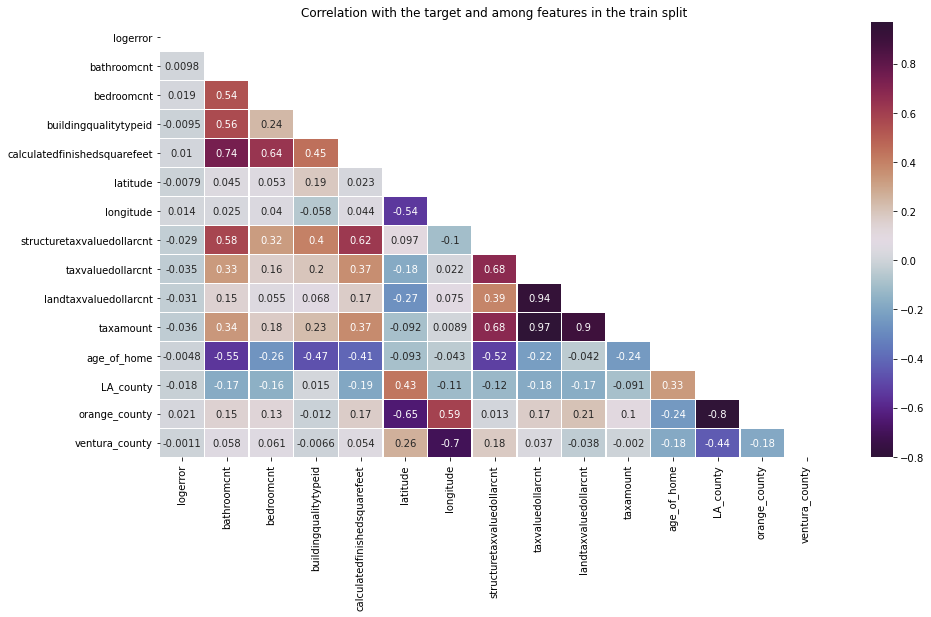

In [57]:
# call function from explore script
ex.create_heatmap(train, cols)

### Takeaways

- The darkest colors show the highest correlation
- None of the features seem to be highly correlated with our target variable of log error
- A bunch of features seem to be highly correlated with each other 
    - For example, bedroomcnt, buildingqualitytypeid, calculatedfinishedsquarefeet as well as the tax variables seem to be highly correlated with bathroomcnt
- The tax variables(structuretaxvaluedollarcnt, taxvaluedollarcnt, landtaxvaluedollarcnt and taxamount) have high positive correlation with each other; highest being 0.99 of taxvaluedollarcnt with tax amount
- Latitude and Longitude seem to be highly correlated with each other
- age_of_home has some negative correlations with bathroomcnt and buildingqualitytypeid but does not seem to have a high correlation with any variables

## Pairplot

Before finalizing features to use to create clusters, we can visualize interactions of all variables with each other through a pairplot. Our goal is to find distinct clusters or relationships not explained by only linear correlation.

In [59]:
# select variables to use in below function
pairplot_cols = ['logerror', 'bathroomcnt', 'bedroomcnt', 'buildingqualitytypeid', 'calculatedfinishedsquarefeet', 
       'latitude', 'longitude', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt', 'landtaxvaluedollarcnt','taxamount', 'age_of_home']


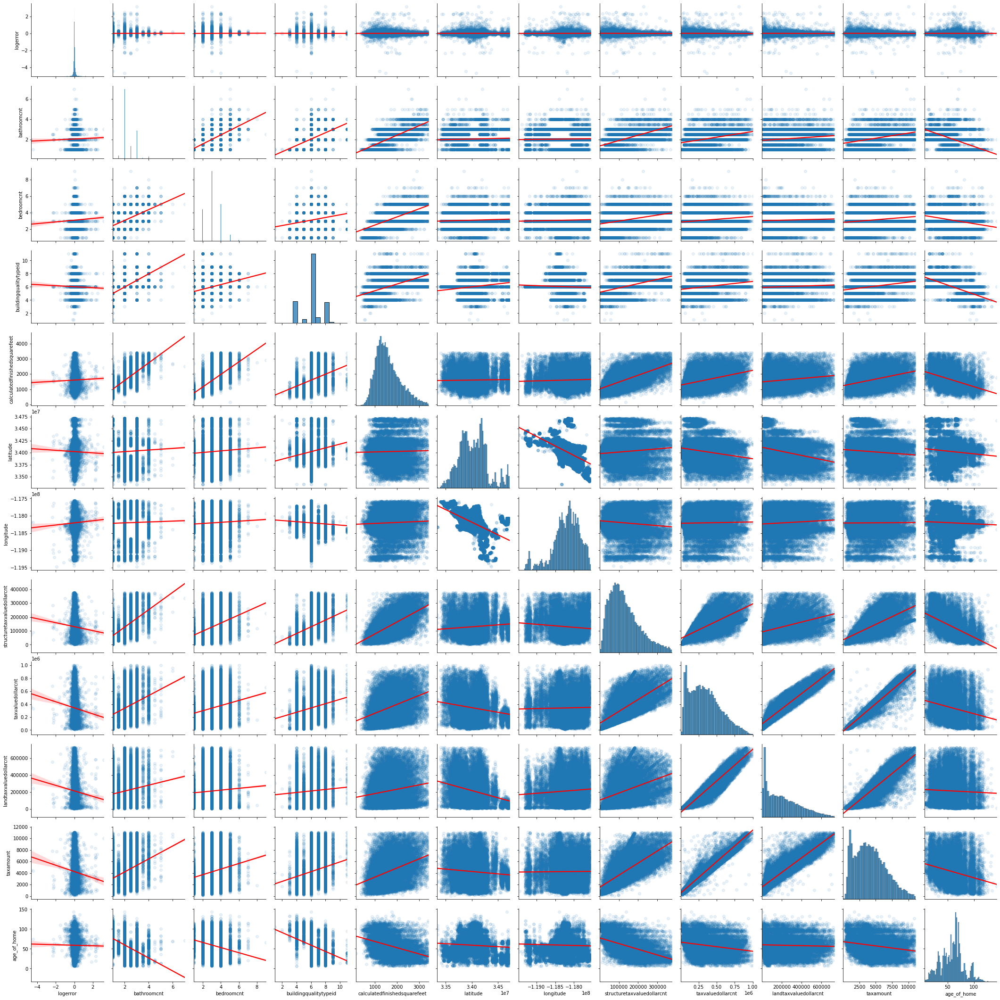

In [60]:
# call function from explore script
ex.plot_variable_pairs(train, pairplot_cols)

### Takeaways

- log error shows very slight positive correlation with bedroomcnt
- building quality seems higher for fewer number of bathrooms
- log error seems to be lower for higher number of bathrooms (verified through stats testing)
- fewer bedrooms and bathrooms in newer homes
- bigger homes with better building quality 
- Newer homes have more variance in number of bedrooms and bathrooms
- building quality after 5 has less variance with age of home

## Clustering 

Based on our EDA and statistical testing, we will create the following clusters and test them to see which might be best utilized in our models. 

- **Cluster 1: bathroomcnt, bedroomcnt, calculatedfinishedsquarefeet, age_of_home, buildingqualitytypeid**

From our exploration, we have seen that these size variables correlate highly with each other and also with the tax variables. We have also determined there to be significant difference in log error for bathroomcnt, bedroomcnt and calculatedfinishedsquarefeet through means testing. Age of home and building quality will also help provide information that could impact the other variables.



- **Cluster 2: structuretaxvaluedollarcnt, taxvaluedollarcnt, landtaxvaluedollarcnt, taxamount**

These tax variables all correlate highly with each other. I want to see if there are any benefits to clustering them together.



- **Cluster 3: bathroomcnt, taxvaluedollarcnt, calculatedfinishedsquarefeet**

As we have seen in our exploration, there is a difference in the log error based on square footage and bathroomcnt. Using domain knowledge, we can also say that tax value of a property will be affected by its square footage and number of bathrooms. I would like to further explore their interaction and relationship with this cluster.

We will utilize K means algorithm to see if clustering the above can help boost our model's performance. Before we begin clustering we will scale our datasets. We will only scale the X variables using a StandardScaler and not the y variables. The original dataframe will be split into X_train, X_validate and X_test to select only features to be included in clustering and modeling.

In [15]:
# assign X and y variables in all our split dfs
X_train = train[['bathroomcnt', 'bedroomcnt','buildingqualitytypeid', 'calculatedfinishedsquarefeet', 
                'latitude', 'longitude', 'lotsizesquarefeet', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt',
                'landtaxvaluedollarcnt', 'taxamount', 'LA_county', 'orange_county', 'ventura_county', 'age_of_home']]
y_train = train[['logerror']]

X_validate = validate[['bathroomcnt', 'bedroomcnt','buildingqualitytypeid', 'calculatedfinishedsquarefeet', 
                'latitude', 'longitude', 'lotsizesquarefeet', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt',
                'landtaxvaluedollarcnt', 'taxamount', 'LA_county', 'orange_county', 'ventura_county', 'age_of_home']]
y_validate = validate[['logerror']]

X_test = test[['bathroomcnt', 'bedroomcnt','buildingqualitytypeid', 'calculatedfinishedsquarefeet', 
                'latitude', 'longitude', 'lotsizesquarefeet', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt',
                'landtaxvaluedollarcnt', 'taxamount', 'LA_county', 'orange_county', 'ventura_county', 'age_of_home']]
y_test = test[['logerror']]

In [16]:
# quick check of our split dfs
X_train.shape, X_validate.shape, X_test.shape

((25379, 15), (10878, 15), (9065, 15))

- They all have different number of rows but the same number of columns which is what we want to see.

In [17]:
# scale data
X_train_scaled, X_validate_scaled, X_test_scaled = pr.scale_data(X_train, X_validate, X_test)

In [18]:
# quick look at our scaled X train  
X_train_scaled.head()

,bathroomcnt,bedroomcnt,buildingqualitytypeid,calculatedfinishedsquarefeet,latitude,longitude,lotsizesquarefeet,structuretaxvaluedollarcnt,taxvaluedollarcnt,landtaxvaluedollarcnt,taxamount,LA_county,orange_county,ventura_county,age_of_home
46941,-0.072468,-0.114903,1.554554,0.142558,2.174911,0.043206,0.198063,0.236831,-0.357848,-0.557821,-0.043353,0.724504,-0.581005,-0.318020,-1.250778
69895,-0.072468,1.048289,-0.020857,-0.548494,0.307509,1.014537,0.308484,-0.276131,0.367876,0.588510,0.367925,0.724504,-0.581005,-0.318020,0.052485
29395,1.331473,-0.114903,-0.020857,1.294910,-0.707722,0.597727,-0.470289,1.021739,0.400017,0.030492,0.335738,-1.380256,1.721155,-0.318020,-1.064597
8373,-0.072468,-0.114903,-0.020857,-0.207455,0.932957,-1.287197,-0.016949,0.047952,-0.651027,-0.838313,-0.652104,-1.380256,-0.581005,3.144456,-0.831872
44498,1.331473,1.048289,0.766848,2.404183,1.646644,-0.861927,1.532825,2.898894,0.550137,-0.646662,1.119117,0.724504,-0.581005,-0.318020,-1.623138


### Cluster 1: bathroomcnt, bedroomcnt, calculatedfinishedsquarefeet, age_of_home, buildingqualitytypeid

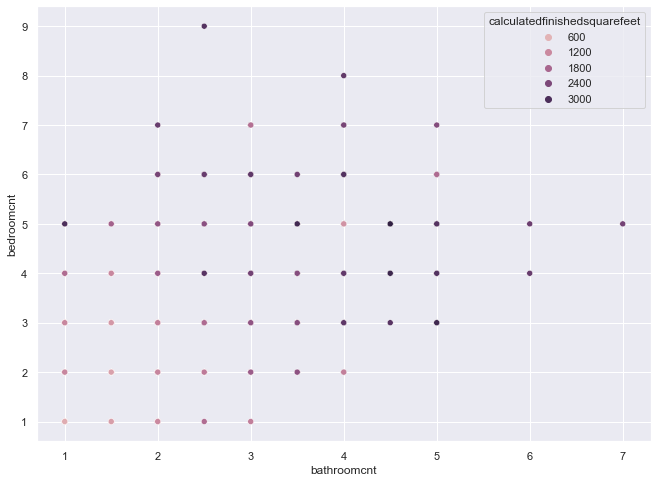

In [17]:
# Visualizing the cluster
sns.set(rc={'figure.figsize':(11,8)})
sns.scatterplot(data=train, x='bathroomcnt', y='bedroomcnt', hue='calculatedfinishedsquarefeet')
plt.show()

- As the number of bedrooms and bathrooms increases, so does the size (square footage) of the property.

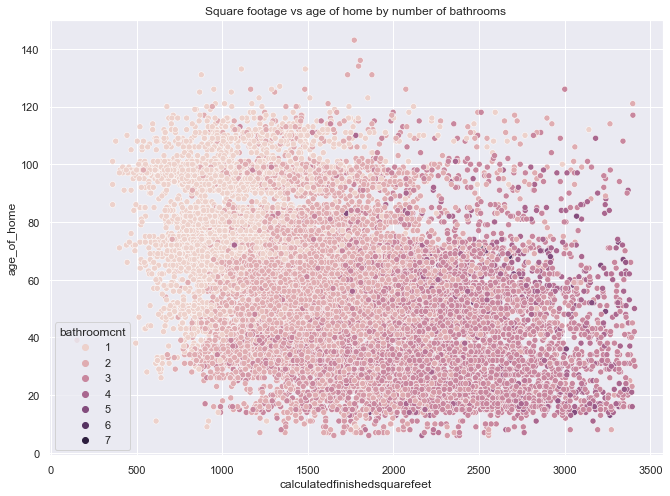

In [18]:
# create a scatterplot 
sns.scatterplot(data=train, x='calculatedfinishedsquarefeet', y='age_of_home', hue='bathroomcnt')
plt.title('Square footage vs age of home by number of bathrooms')
plt.show()

- Fewer bathrooms means lower square footage
- Newer homes have higher number of bathrooms than older homes

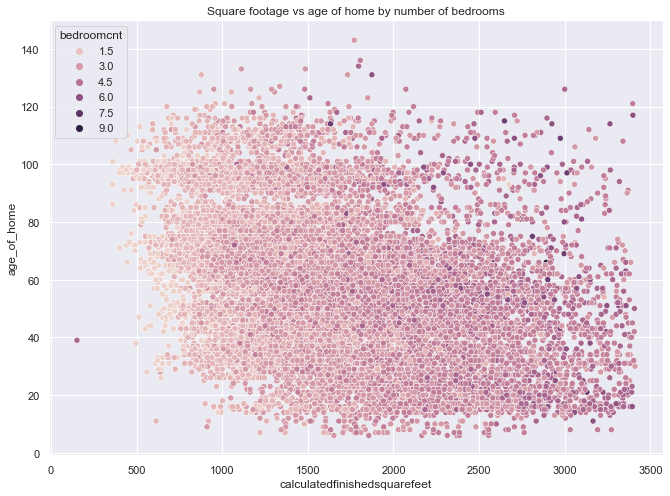

In [19]:
sns.set(rc={'figure.figsize':(11,8)})
sns.scatterplot(data=train, x='calculatedfinishedsquarefeet', y='age_of_home', hue='bedroomcnt')
plt.title('Square footage vs age of home by number of bedrooms')
plt.show()

- few homes have more than 3000 sq ft
- fewer bedrooms in smaller homes
    - 1 to 3 bedroom properties are under 1500 sq ft
- newer homes seem to be more between 1500 - 2500 sq ft

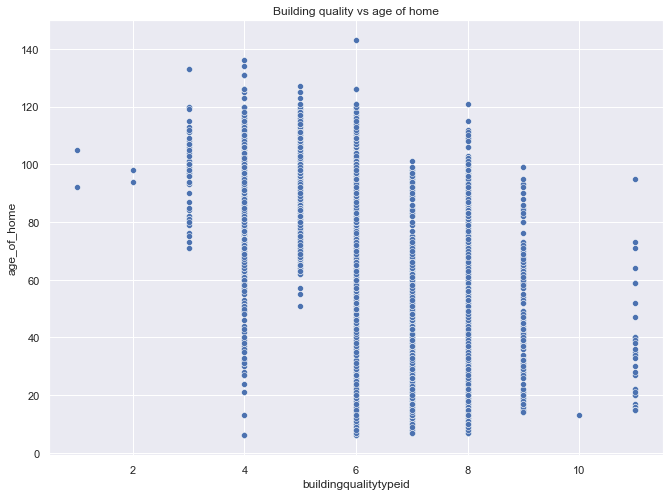

In [20]:
sns.set(rc={'figure.figsize':(11,8)})
sns.scatterplot(data=train, x='buildingqualitytypeid', y='age_of_home')
plt.title('Building quality vs age of home')
plt.show()

- After building quality type 6 age of home spread starts reducing. 

In [21]:
# define independent variables for k-means

X1 = X_train_scaled[['bathroomcnt', 'bedroomcnt', 'calculatedfinishedsquarefeet', 'age_of_home', 'buildingqualitytypeid']]
X1.head()


,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,age_of_home,buildingqualitytypeid
46941,-0.072468,-0.114903,0.142558,-1.250778,1.554554
69895,-0.072468,1.048289,-0.548494,0.052485,-0.020857
29395,1.331473,-0.114903,1.294910,-1.064597,-0.020857
8373,-0.072468,-0.114903,-0.207455,-0.831872,-0.020857
44498,1.331473,1.048289,2.404183,-1.623138,0.766848


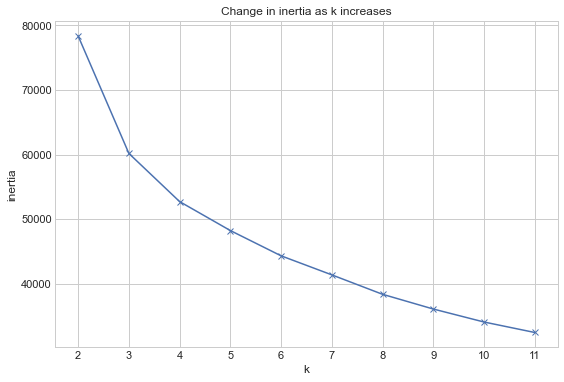

In [22]:
# find optimum number of clusters using elbow method

with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X1).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

- looks like k=4 is the best number of clusters to use for this set as the graph starts to flatten after that

In [23]:
# sklearn implementation of KMeans on scaled data

#define the thing
kmeans1 = KMeans(n_clusters=4, random_state = 123)

# fit the thing
kmeans1.fit(X1)

# Use (predict using) the thing 
kmeans1.predict(X1)

array([0, 3, 1, ..., 1, 3, 1], dtype=int32)

In [24]:
# make a new column named cluster in train df and X_scaled dataframe

train['cluster1'] = kmeans1.predict(X1)

X_train_scaled['cluster1'] = kmeans1.predict(X1)

In [25]:
# find average values for each feature in the cluster
kmeans1.cluster_centers_


array([[ 0.27205195, -0.5133117 , -0.13738415, -0.8299616 ,  0.7523382 ],
       [ 1.21724652,  1.07709695,  1.4388529 , -0.71243915,  0.6117926 ],
       [-1.27579552, -0.83790031, -0.97082028,  0.97228069, -1.15680192],
       [-0.05575826,  0.23347611, -0.14969414,  0.30785514, -0.06134338]])

In [26]:
centroids = pd.DataFrame(kmeans1.cluster_centers_, columns=X1.columns)
centroids

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,age_of_home,buildingqualitytypeid
0,0.272052,-0.513312,-0.137384,-0.829962,0.752338
1,1.217247,1.077097,1.438853,-0.712439,0.611793
2,-1.275796,-0.837900,-0.970820,0.972281,-1.156802
3,-0.055758,0.233476,-0.149694,0.307855,-0.061343


In [27]:
train.cluster1.value_counts()

3    8447
2    5998
0    5484
1    5450
Name: cluster1, dtype: int64

- Type 3 has the highest number of observations, other property types contain fairly similar number of observations.

#### Visualize Cluster 1 vs Actual

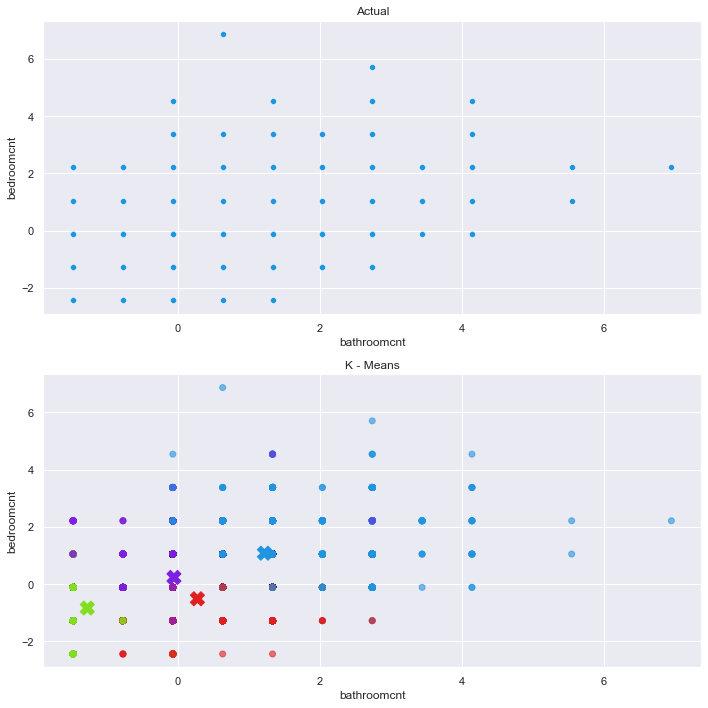

In [28]:
centroids = np.array(X_train_scaled.groupby('cluster1')['bathroomcnt', 'bedroomcnt', 'calculatedfinishedsquarefeet', 'age_of_home',
                                         'buildingqualitytypeid'].mean())
cen_x = [i[0] for i in centroids]
cen_y = [i[1] for i in centroids]

X_train_scaled['cen_x'] = X_train_scaled.cluster1.map({0:cen_x[0], 1:cen_x[1], 2:cen_x[2]})
X_train_scaled['cen_y'] = X_train_scaled.cluster1.map({0:cen_y[0], 1:cen_y[1], 2:cen_y[2]})

colors = ['#DF2020','#2095DF', '#81DF20', '#7e20df']
X_train_scaled['c'] = X_train_scaled.cluster1.map({0:colors[0], 1:colors[1], 2:colors[2], 3:colors[3]})
#
# specify custom palette for sns scatterplot

colors1 = ['#2095DF','#81DF20' ,'#DF2020', '#7e20df']
customPalette = sns.set_palette(sns.color_palette(colors1))

    #plot the scatterplots

#Define figure (num of rows, columns and size)
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(10,10))

# plot scatter chart for Actual species and those predicted by K - Means

# plot ax1 
ax1 = plt.subplot(2,1,1) 
sns.scatterplot(data = X_train_scaled, x = 'bathroomcnt', y = 'bedroomcnt', ax = ax1)
plt.title('Actual')

#plot ax2
ax2 = plt.subplot(2,1,2) 
ax2.scatter(X_train_scaled.bathroomcnt, X_train_scaled.bedroomcnt, alpha = 0.6, c=X_train_scaled.c)
ax2.set(xlabel = 'bathroomcnt', ylabel = 'bedroomcnt', title = 'K - Means')

# plot centroids on  ax2
ax2.scatter(cen_x, cen_y, marker='X', c=colors, s=200)
    
    
X_train_scaled.drop(columns = ['cen_x', 'cen_y', 'c'], inplace = True)
plt.tight_layout()
plt.show()

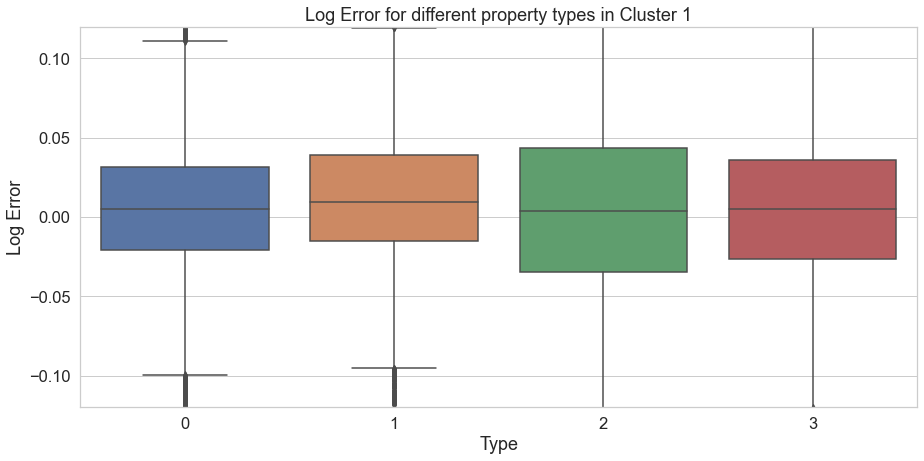

In [29]:
sns.set(style="whitegrid", font_scale=1.5)
plt.figure(figsize=(15,7))
# limit y for better visualization
plt.ylim(-.12, .12) 
sns.boxplot(data=train, x=train.cluster1, y=train.logerror)
plt.title('Log Error for different property types in Cluster 1')
plt.xlabel('Type')
plt.ylabel('Log Error')
plt.show()

- Median for all types in cluster 1 looks to be around 0 
- type 2 has the highest IQR while type 1 has the smallest IQR


#### Description of Cluster Sets

- Type 0: Not very old properties (41 years) with around 2 beds, 2baths, lower than average square footage, and above average tax amount with building quality of 6. These properties have the lowest log error.

- Type 1: Almost 3 baths, 4 beds, building quality of 6, biggest and most expensive homes in the cluster, about the same age as type 1 (43 years). These properties have the highest log error.

- Type 2: Log Error higher than type 0 but lower than type 1. These properties are the oldest ones and smaller with lower building quality of 4 and 2 beds and 1 bath. Their property values are also the lowest amongst all in the cluster.

- Type 3: Log Error is lower than type 2's but very close. They have 2 baths and 3 beds, smallest square footage of all but tax value is higher than type 2. These properties are also older than types 0 and 1 but newer than type 3. 


In [30]:
# check mean of variables for cluster sets
train.groupby('cluster1').mean()

,propertylandusetypeid,heatingorsystemtypeid,parcelid,id,logerror,bathroomcnt,bedroomcnt,buildingqualitytypeid,calculatedbathnbr,calculatedfinishedsquarefeet,...,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,censustractandblock,age_of_home,LA_county,orange_county,ventura_county,abs_logerror
cluster1,,,,,,,,,,,,,,,,,,,,,
0,262.407367,2.323599,1.311611e+07,39032.734865,0.009469,2.246627,2.658096,6.984318,2.246627,1526.291028,...,365075.971189,2016.0,213444.722101,4489.694307,6.052235e+13,41.033552,0.606674,0.272611,0.120715,0.051422
1,261.075780,2.391644,1.329509e+07,40020.631193,0.023058,2.918349,4.025872,6.800917,2.918349,2403.250459,...,453208.026239,2016.0,247497.886789,5538.956778,6.053953e+13,43.599266,0.528073,0.350642,0.121284,0.057650
2,261.158386,6.485156,1.240574e+07,38261.064522,0.017745,1.142464,2.377959,4.558186,1.142631,1060.451817,...,251920.981994,2016.0,178496.745082,3255.422821,6.041832e+13,79.758920,0.886462,0.075358,0.038179,0.089280
3,261.032793,4.040941,1.308655e+07,38555.741565,0.016535,2.011365,3.298568,5.947555,2.011365,1517.456257,...,319889.964366,2016.0,213597.742512,3952.308234,6.050730e+13,65.476974,0.606251,0.301527,0.092222,0.066661


- Mean log error seems to be the lowest for type 0 and highest for type 1
- Types 2 and 3 have fairly similar mean log errors
- We will confirm that through statistical testing

#### Levene's test for equal variances

alpha = 0.05

$H_{0}$: Variance in logerror for type 1 properties is equivalent to others

$H_{a}$: Variance in logerror for type 1 properties is not equivalent to others

In [31]:
stats.levene(train[train.cluster1 == 1].logerror, train[train.cluster1 != 1].logerror)

LeveneResult(statistic=31.89107803402837, pvalue=1.648072147485765e-08)

- Since the p-value is less than our alpha of 0.05 we will reject the null hypothesis and proceed with presumption of inequal variance.

#### Independent T-test (2 samples)

For a 2-tailed test where our alternative hypothesis is testing for "greater than", we evaluate 𝑝/2 < 𝛼 and t > 0.

- Setting Hypothesis

$H_{0}$: Mean logerror for type 1 properties is not significantly different than other property types

$H_{a}$:  Mean logerror for type 1 properties is significantly higher than other property types


- Verify assumptions

Normal distribution


In [32]:
stats.ttest_ind(train[train.cluster1 == 1].logerror, train[train.cluster1 != 1].logerror, equal_var=False)


Ttest_indResult(statistic=3.507269705023509, pvalue=0.0004548654134814723)

- Since the p/2 value is less than alpha of 0.05, we can reject the null hypothesis and say that the mean log error of type 1 properties in cluster 1 is signifcantly higher than that of other property types in the same cluster. Now let's check if the log error of property types 2 and 3 are significantly differ from each other.

#### Levene's test for equal variances

alpha = 0.05

$H_{0}$: Variance in logerror for type 2 properties is equivalent to that of type 3 properties

$H_{a}$: Variance in logerror for type 2 properties is not equivalent to that of type 3 properties

In [33]:
stats.levene(train[train.cluster1 == 2].logerror, train[train.cluster1 == 3].logerror)

LeveneResult(statistic=71.45487406089727, pvalue=3.105544849415607e-17)

- Since the p-value is less than alpha of 0.05, we will reject the null hypothesis and proceed with the presumption that variances are inequal.

#### Independent T-test (2 samples)

For a 2-tailed test where our alternative hypothesis is testing for "equal to", we evaluate 𝑝 < 𝛼.

- Setting Hypothesis

$H_{0}$: Mean logerror for type 2 properties is not significantly different than that for property type 3

$H_{a}$:  Mean logerror for type 1 properties is significantly different than that for property type 3


- Verify assumptions

Normal distribution


In [34]:
stats.ttest_ind(train[train.cluster1 == 2].logerror, train[train.cluster1 == 3].logerror, equal_var=False)


Ttest_indResult(statistic=0.3921192818597068, pvalue=0.6949775768210914)

- Since the p-value is higher than alpha of 0.05, we fail to reject the null and can say that the mean log error of type 2 properties in cluster 1 is not signifcantly different than that of type 3 properties in the same cluster.

### Cluster 2: structuretaxvaluedollarcnt, taxvaluedollarcnt, landtaxvaluedollarcnt, taxamount

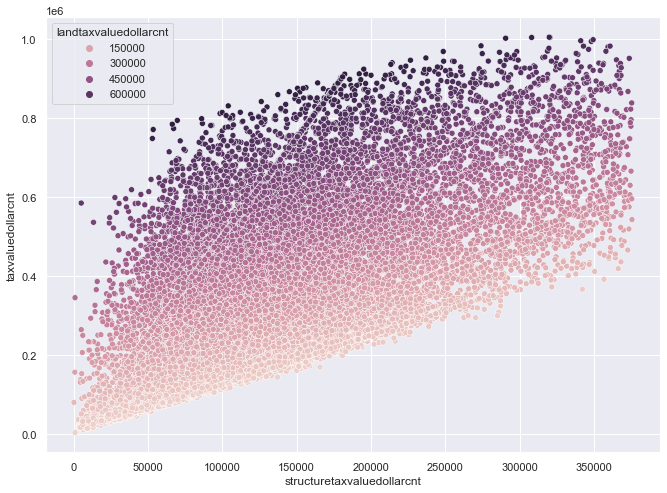

In [35]:
# Visualizing the variables in cluster
sns.set(rc={'figure.figsize':(11,8)})
sns.scatterplot(data=train, x='structuretaxvaluedollarcnt', y='taxvaluedollarcnt', hue='landtaxvaluedollarcnt')
plt.show()

- It looks like all values move in one direction 
    - As one increases so does the other

In [36]:
# define independent variables for k-means

X2 = X_train_scaled[['structuretaxvaluedollarcnt', 'taxvaluedollarcnt', 'landtaxvaluedollarcnt', 'taxamount']]
X2.head()

,structuretaxvaluedollarcnt,taxvaluedollarcnt,landtaxvaluedollarcnt,taxamount
46941,0.236831,-0.357848,-0.557821,-0.043353
69895,-0.276131,0.367876,0.588510,0.367925
29395,1.021739,0.400017,0.030492,0.335738
8373,0.047952,-0.651027,-0.838313,-0.652104
44498,2.898894,0.550137,-0.646662,1.119117


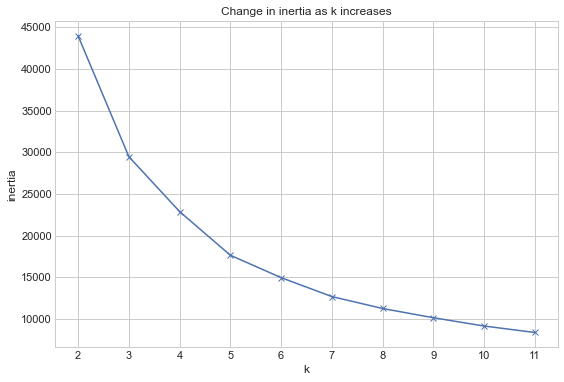

In [37]:
# find optimum number of clusters

with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X2).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

- looks like k =6 is optimum number of clusters based on the elbow method

In [38]:
# sklearn implementation of KMeans on scaled data

#define the thing
kmeans2 = KMeans(n_clusters=6, random_state = 123)

# fit the thing
kmeans2.fit(X2)

# Use (predict using) the thing 
kmeans2.predict(X2)

array([5, 0, 3, ..., 3, 5, 3], dtype=int32)

In [39]:
# make a new column named cluster in train df and X_scaled dataframe

train['cluster2'] = kmeans2.predict(X2)

X_train_scaled['cluster2'] = kmeans2.predict(X2)

#### Visualize Cluster 2 vs Actual 

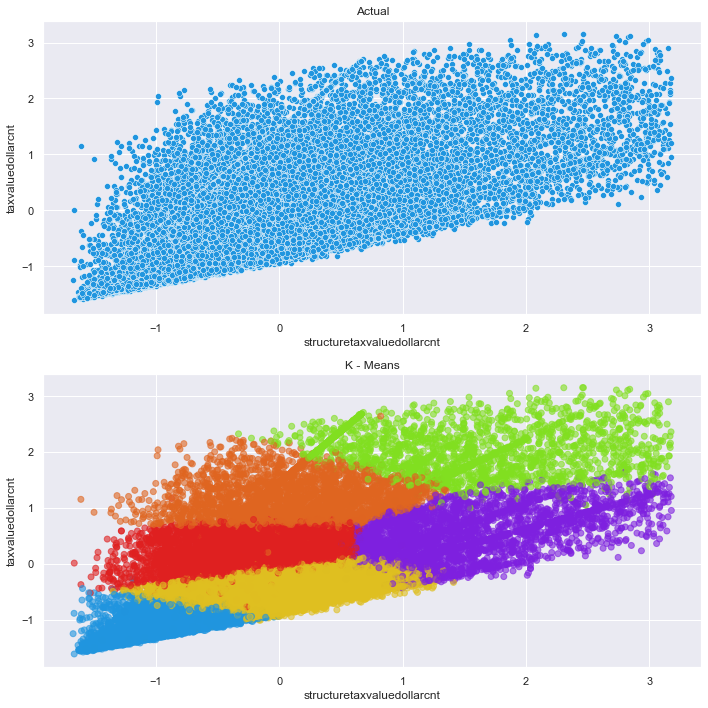

In [40]:
centroids = np.array(X_train_scaled.groupby('cluster2')['structuretaxvaluedollarcnt', 'taxvaluedollarcnt', 'landtaxvaluedollarcnt', 'taxamount'].mean())
cen_x = [i[0] for i in centroids]
cen_y = [i[1] for i in centroids]

X_train_scaled['cen_x'] = X_train_scaled.cluster2.map({0:cen_x[0], 1:cen_x[1], 2:cen_x[2],3:cen_x[3], 4:cen_x[4], 5:cen_x[5]})
X_train_scaled['cen_y'] = X_train_scaled.cluster2.map({0:cen_y[0], 1:cen_y[1], 2:cen_y[2], 3:cen_y[3], 4:cen_y[4], 5:cen_y[5]})

colors = ['#DF2020','#2095DF', '#81DF20', '#7e20df', '#DF6520', '#DFBF20']
X_train_scaled['c'] = X_train_scaled.cluster2.map({0:colors[0], 1:colors[1], 2:colors[2], 3:colors[3], 
                                                  4:colors[4], 5:colors[5]})
#
# specify custom palette for sns scatterplot

colors1 = ['#2095DF','#81DF20' ,'#DF2020', '#7e20df', '#DF6520', '#DFBF20']
customPalette = sns.set_palette(sns.color_palette(colors1))

    #plot the scatterplots

#Define figure (num of rows, columns and size)
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(10,10))

# plot scatter chart for Actual species and those predicted by K - Means

# plot ax1 
ax1 = plt.subplot(2,1,1) 
sns.scatterplot(data = X_train_scaled, x = 'structuretaxvaluedollarcnt', y = 'taxvaluedollarcnt', ax = ax1)
plt.title('Actual')

#plot ax2
ax2 = plt.subplot(2,1,2) 
ax2.scatter(X_train_scaled.structuretaxvaluedollarcnt, X_train_scaled.taxvaluedollarcnt, alpha = 0.6, c=X_train_scaled.c)
ax2.set(xlabel = 'structuretaxvaluedollarcnt', ylabel = 'taxvaluedollarcnt', title = 'K - Means')

# plot centroids on  ax2
ax2.scatter(cen_x, cen_y, marker='X', c=colors, s=200)
    
    
X_train_scaled.drop(columns = ['cen_x', 'cen_y', 'c'], inplace = True)
plt.tight_layout()
plt.show()

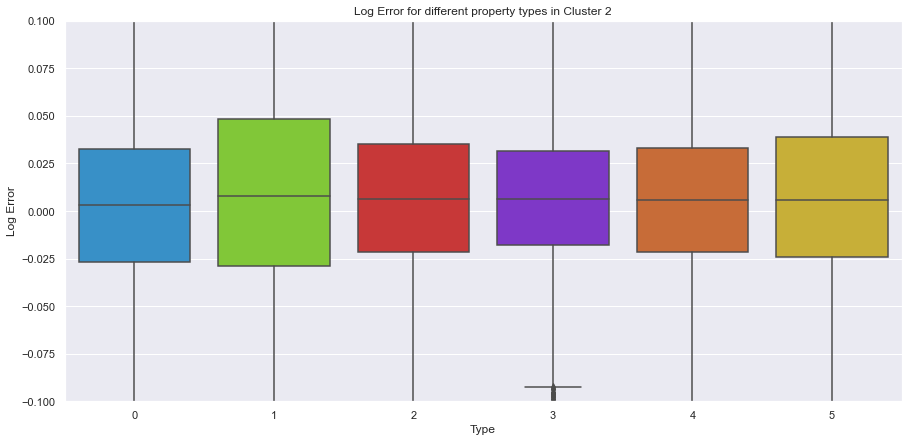

In [41]:
plt.figure(figsize=(15,7))
# limit y for better visualization
plt.ylim(-.1, .1) 
sns.boxplot(data=train, x=train.cluster2, y=train.logerror)
plt.title('Log Error for different property types in Cluster 2')
plt.xlabel('Type')
plt.ylabel('Log Error')
plt.show()

- property type 1 has highest IQR in cluster 2 while property type 3 has lowest IQR
- median for all property types seems to be around 0

In [42]:
# mean variables for the sets in cluster 2
train.groupby('cluster2').mean()

,propertylandusetypeid,heatingorsystemtypeid,parcelid,id,logerror,bathroomcnt,bedroomcnt,buildingqualitytypeid,calculatedbathnbr,calculatedfinishedsquarefeet,...,assessmentyear,landtaxvaluedollarcnt,taxamount,censustractandblock,age_of_home,LA_county,orange_county,ventura_county,abs_logerror,cluster1
cluster2,,,,,,,,,,,,,,,,,,,,,
0,261.375718,4.901701,1.292937e+07,38530.800656,0.011596,1.810808,2.901764,5.660377,1.810911,1357.427810,...,2016.0,283965.817884,4753.578739,6.047892e+13,65.470057,0.643970,0.302502,0.053527,0.062297,1.995283
1,261.208333,4.848224,1.270461e+07,38040.394712,0.026336,1.722035,2.921474,5.603365,1.722035,1377.991346,...,2016.0,44196.792949,1441.446343,6.046136e+13,68.565865,0.743269,0.196314,0.060417,0.087016,2.054327
2,261.389577,3.223894,1.311305e+07,40811.100103,0.008776,2.640093,3.444788,6.628999,2.640093,2188.082043,...,2016.0,518963.990712,8945.779804,6.051435e+13,48.736842,0.569143,0.339525,0.091331,0.057682,1.167183
3,261.459355,2.557576,1.348365e+07,39710.049677,0.010816,2.644677,3.528710,6.754839,2.644677,2126.813548,...,2016.0,202499.786452,5612.977890,6.056992e+13,41.141613,0.582258,0.214839,0.202903,0.046255,1.057097
4,261.266667,4.028228,1.316011e+07,39786.166179,0.012946,2.117398,3.160325,6.114146,2.117398,1646.926504,...,2016.0,451992.936585,6909.922241,6.050937e+13,59.375285,0.522602,0.415285,0.062114,0.059153,1.723902
5,261.524715,3.830660,1.290058e+07,38626.731382,0.018288,2.059675,3.078374,6.145203,2.059756,1549.760976,...,2016.0,115527.284390,3180.769598,6.049681e+13,55.686016,0.707317,0.179512,0.113171,0.066823,1.528293


- There seems to be quite a bit of variation in log errors among the different property types in this cluster
- Highest mean log error is for type 1 while lowest is for type 2
- Property types 0, 3 and 4 have mean log errors very close in value to each other


#### Description of Cluster Sets

- Type 0: Mean bathrooms 1.8 and almost 3 bedrooms, building quality type 5.7, smallest size properties in the cluster, cheaper than types 2 and 4 but more expensive than types 1, 3 and 5. These properties are also among the older ones in the cluster with average age of 65 years. Mean log error is very similar to types 3 and 4.

- Type 1: Mean bathrooms at 1.7, almost 3 beds, building quality same as type 1, smaller than all other properties in the cluster except type 0, cheapest and oldest homes in the cluster (69 years). These properties have the highest log error.

- Type 2: These properties are newer than all except type 3 and also the most expensive and biggest ones in the cluster. Theu have higher building quality than all except type 3 properties. They have around 2.6 avg bathrooms and 3 bedrooms.

- Type 3: Avg 2.6 baths and 3.5 beds. Not as expensive as property types 2 and 4, but they have the highest building quality. They are smaller than type 2 properties but bigger than others. These are the newest properties in the cluster.

- Type 4: Oldest properties, more expensive than all exccept type 2. Size is not as big as types 2 and 3. Avg 3 beds and 2 baths with building quality of about 6.

- Type 5: Average 3 beds and 3 baths, building quality over 6, size only bigger than types 0 and 1, cheaper homes than all other except type 1. These properties are among the older ones with average age of 56 years.

#### Levene's test for equal variances

alpha = 0.05

$H_{0}$: Variance in logerror for type 2 properties is equivalent to that of other properties

$H_{a}$: Variance in logerror for type 2 properties is not equivalent to that of other properties

In [43]:
stats.levene(train[train.cluster1 == 2].logerror, train[train.cluster1 != 2].logerror)

LeveneResult(statistic=195.2758249927196, pvalue=3.27181684382928e-44)

- Since the p-value is less than alpha of 0.05, we will reject the null hypothesis and proceed with the presumption of inequal variance.

#### Independent T-test (2 samples)

For a 2-tailed test where our alternative hypothesis is testing for "equal to", we evaluate 𝑝 < 𝛼.

- Setting Hypothesis

$H_{0}$: Mean logerror for type 2 properties is not significantly different than that of other properties

$H_{a}$:  Mean logerror for type 2 properties is significantly different than that of other properties

- Verify assumptions

Normal distribution

In [44]:
stats.ttest_ind(train[train.cluster2 == 2].logerror, train[train.cluster2 != 2].logerror, equal_var=False)


Ttest_indResult(statistic=-2.5049311722996612, pvalue=0.0123145987769707)

- Since p-value is less than alpha, we will reject the null hypothesis and say that Mean logerror for type 2 properties is significantly different than that of other properties.

#### Levene's test for equal variances

alpha = 0.05

$H_{0}$: Variance in logerror for type 0 properties is equivalent to that of type 4 properties

$H_{a}$: Variance in logerror for type 0 properties is not equivalent to that of type 4 properties

In [45]:
stats.levene(train[train.cluster2 == 0].logerror, train[train.cluster2 == 4].logerror)

LeveneResult(statistic=0.9997284247815811, pvalue=0.31740666534175943)

- Since p-value is more than alpha, we fail to reject the null and proceed with presumption of equal variance.

#### Independent T-test (2 samples)


For a 2-tailed test where our alternative hypothesis is testing for "equal to", we evaluate 𝑝 < 𝛼.

- Setting Hypothesis

$H_{0}$: Mean logerror for type 0 properties is not significantly different than that of type 4 properties 

$H_{a}$:  Mean logerror for type 0 properties is significantly different than that of type 4 properties 

- Verify assumptions

Normal distribution



In [46]:
stats.ttest_ind(train[train.cluster2 == 0].logerror, train[train.cluster2 == 4].logerror, equal_var=True)


Ttest_indResult(statistic=-0.365579473263776, pvalue=0.7146886217802113)

- Since p-value is not less than alpha, we fail to reject the null hypothesis and say that Mean logerror for type 0 properties is not significantly different than that of type 4 properties.

#### Levene's test for equal variances

alpha = 0.05

$H_{0}$: Variance in logerror for type 0 properties is equivalent to that of type 5 properties

$H_{a}$: Variance in logerror for type 0 properties is not equivalent to that of type 5 properties

In [47]:
stats.levene(train[train.cluster2 == 0].logerror, train[train.cluster2 == 5].logerror)

LeveneResult(statistic=2.2249065190549704, pvalue=0.13582949007029227)

- Since p-value is more than alpha, we fail to reject the null and proceed with presumption of equal variance.

#### Independent T-test (2 samples)

For a 2-tailed test where our alternative hypothesis is testing for "equal to", we evaluate 𝑝 < 𝛼.

alpha = 0.05 

- Setting Hypothesis

$H_{0}$: Mean logerror for type 0 properties is not significantly different from that of type 5 properties 

$H_{a}$:  Mean logerror for type 0 properties is significantly different from that of type 5 properties 

- Verify assumptions

Normal distribution


In [48]:
stats.ttest_ind(train[train.cluster2 == 0].logerror, train[train.cluster2 == 5].logerror, equal_var=False)


Ttest_indResult(statistic=-2.142767318990548, pvalue=0.03215503086740702)

- Since p-value is less than alpha, we will reject the null hypothesis and say that Mean logerror for type 0 properties is significantly different than that of type 5 properties.

### Cluster 3: bathroomcnt, taxvaluedollarcnt, calculatedfinishedsquarefeet

In [19]:
# define independent variables for k-means

X3 = X_train_scaled[['bathroomcnt', 'taxvaluedollarcnt', 'calculatedfinishedsquarefeet']]
X3.head()



,bathroomcnt,taxvaluedollarcnt,calculatedfinishedsquarefeet
46941,-0.072468,-0.357848,0.142558
69895,-0.072468,0.367876,-0.548494
29395,1.331473,0.400017,1.294910
8373,-0.072468,-0.651027,-0.207455
44498,1.331473,0.550137,2.404183


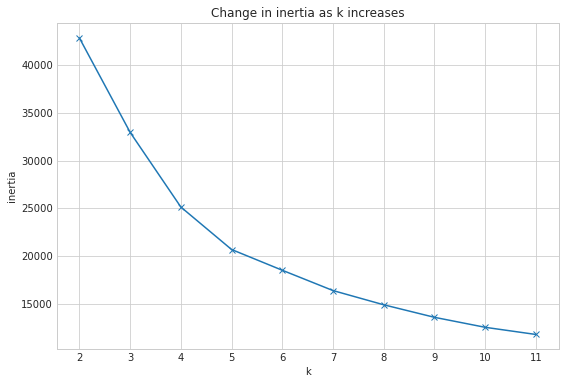

In [20]:
# find optimum number of clusters

with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X3).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

- based on the elbow method, we will select k=5 for our cluster

In [21]:
# sklearn implementation o`f KMeans on scaled data

#define the thing
kmeans3 = KMeans(n_clusters=5, random_state = 123)

# fit the thing
kmeans3.fit(X3)

# Use (predict using) the thing 
kmeans3.predict(X3)

array([0, 3, 2, ..., 1, 0, 2], dtype=int32)

In [22]:
# make a new column named cluster in train df and X_scaled dataframe

train['cluster3'] = kmeans3.predict(X3)

X_train_scaled['cluster3'] = kmeans3.predict(X3)

#### Visualize Cluster3 vs Actual

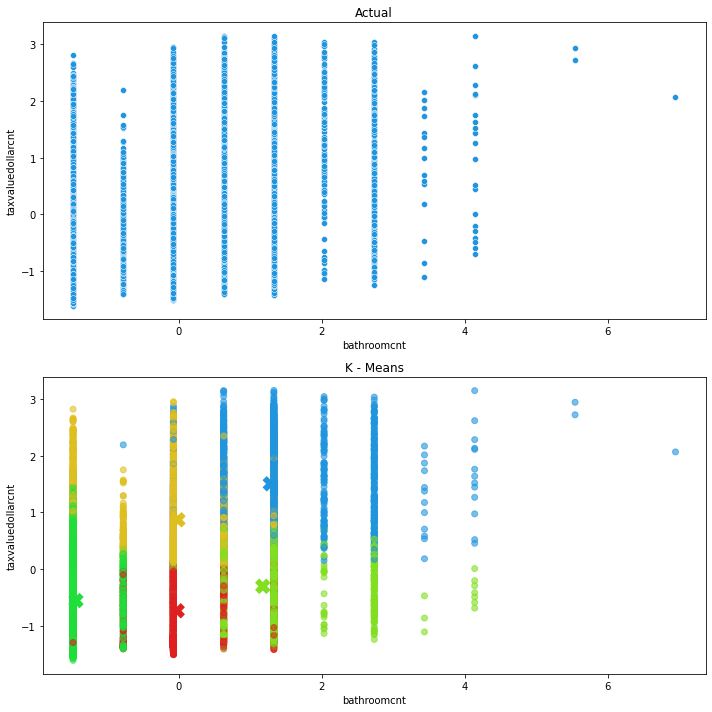

In [21]:
centroids = np.array(X_train_scaled.groupby('cluster3')['bathroomcnt', 'taxvaluedollarcnt', 'calculatedfinishedsquarefeet'].mean())
cen_x = [i[0] for i in centroids]
cen_y = [i[1] for i in centroids]

X_train_scaled['cen_x'] = X_train_scaled.cluster3.map({0:cen_x[0], 1:cen_x[1], 2:cen_x[2], 3:cen_x[3], 4:cen_x[4]})
X_train_scaled['cen_y'] = X_train_scaled.cluster3.map({0:cen_y[0], 1:cen_y[1], 2:cen_y[2], 3:cen_x[3], 4:cen_x[4]})

colors = ['#DF2020','#2095DF', '#81DF20', '#DFBF20', '#20DF3A']
X_train_scaled['c'] = X_train_scaled.cluster3.map({0:colors[0], 1:colors[1], 2:colors[2], 3:colors[3], 4:colors[4]})
#
# specify custom palette for sns scatterplot

colors1 = ['#2095DF','#81DF20' ,'#DF2020', '#DFBF20', '#20DF3A']
customPalette = sns.set_palette(sns.color_palette(colors1))

    #plot the scatterplots

#Define figure (num of rows, columns and size)
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(10,10))

# plot scatter chart for Actual species and those predicted by K - Means

# plot ax1 
ax1 = plt.subplot(2,1,1) 
sns.scatterplot(data = X_train_scaled, x = 'bathroomcnt', y = 'taxvaluedollarcnt', ax = ax1)
plt.title('Actual')

#plot ax2
ax2 = plt.subplot(2,1,2) 
ax2.scatter(X_train_scaled.bathroomcnt, X_train_scaled.taxvaluedollarcnt, alpha = 0.6, c=X_train_scaled.c)
ax2.set(xlabel = 'bathroomcnt', ylabel = 'taxvaluedollarcnt', title = 'K - Means')

# plot centroids on  ax2
ax2.scatter(cen_x, cen_y, marker='X', c=colors, s=200)    
    
X_train_scaled.drop(columns = ['cen_x', 'cen_y', 'c'], inplace = True)
plt.tight_layout()
plt.legend()
plt.show()

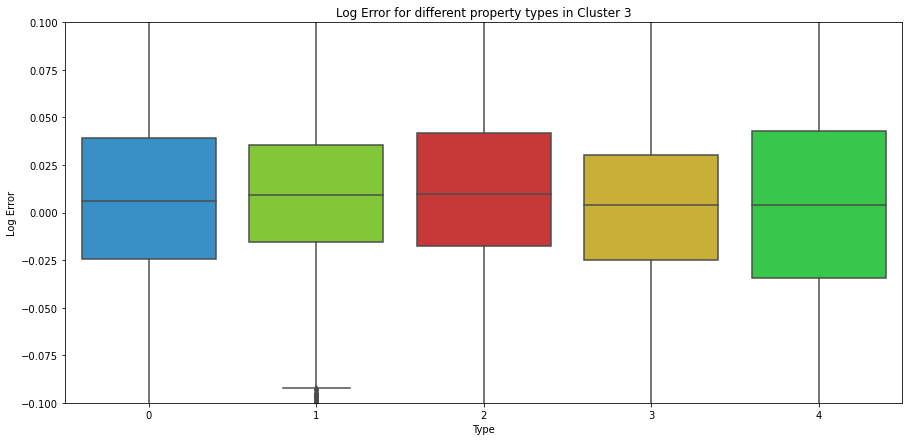

In [22]:
plt.figure(figsize=(15,7))
# limit y for better visualization
plt.ylim(-.1, .1) 
sns.boxplot(data=train, x=train.cluster3, y=train.logerror)
plt.title('Log Error for different property types in Cluster 3')
plt.xlabel('Type')
plt.ylabel('Log Error')
plt.show()

- median seems to be slightly higher for type 2 properties
- highest IQR for type 4 properties while lowest is for type 1 properties

In [23]:
# show all columns
pd.set_option('display.max_columns', None)

In [24]:
# check mean of variables by sets in cluster 3
train.groupby('cluster3').mean()

,propertylandusetypeid,heatingorsystemtypeid,parcelid,id,logerror,bathroomcnt,bedroomcnt,buildingqualitytypeid,calculatedbathnbr,calculatedfinishedsquarefeet,finishedsquarefeet12,fips,fullbathcnt,latitude,longitude,lotsizesquarefeet,rawcensustractandblock,regionidcity,regionidcounty,regionidzip,roomcnt,unitcnt,yearbuilt,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,censustractandblock,age_of_home,LA_county,orange_county,ventura_county
cluster3,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,261.485086,3.696701,1.292021e+07,38300.909850,0.019440,2.036988,3.072385,6.123293,2.036988,1437.210394,1437.696540,6049.053294,2.009280,3.406495e+07,-1.182098e+08,6984.003977,6.049395e+07,32638.305316,2600.815060,96601.223518,1.803659,1.000389,1962.380220,93430.129391,187264.253878,2016.0,93834.124486,2509.014820,6.049393e+13,58.619780,0.682752,0.219674,0.097574
1,261.212047,2.554559,1.357674e+07,40392.872214,0.019904,2.964311,3.815111,6.667131,2.964311,2468.864554,2468.618036,6056.006267,2.842618,3.395406e+07,-1.181756e+08,8046.511838,6.056224e+07,31117.918524,2203.143106,96759.675836,2.853760,1.000777,1978.407730,250844.454387,658974.022632,2016.0,408129.568245,7689.126487,6.056152e+13,42.592270,0.448816,0.418872,0.132312
2,261.222690,2.471195,1.285534e+07,39334.914912,0.021923,2.889497,3.783207,6.891884,2.889497,2220.065712,2219.701488,6049.217355,2.807077,3.410759e+07,-1.181875e+08,7955.064589,6.049595e+07,29860.176074,2525.463634,96712.212019,2.285313,1.003913,1974.341196,162065.167088,278158.591969,2016.0,116093.424881,3706.239534,6.049597e+13,46.658804,0.646448,0.268183,0.085369
3,261.461969,3.762542,1.317581e+07,39337.584952,0.006975,2.044616,3.042311,6.230820,2.044616,1531.702502,1532.055812,6051.580836,1.979585,3.397066e+07,-1.182064e+08,7062.379651,6.051824e+07,33676.688838,2410.918505,96545.750247,2.270662,1.000000,1963.078861,152480.513829,525213.495390,2016.0,372732.981561,6233.796067,6.051817e+13,57.921139,0.576556,0.322193,0.101251
4,261.279790,6.457372,1.258798e+07,38171.881591,0.018665,1.028523,2.357103,4.732971,1.028711,1033.170576,1036.961344,6043.723588,1.000751,3.400657e+07,-1.182209e+08,5998.608557,6.044077e+07,40901.176581,2827.640083,96361.113905,0.820604,1.000455,1943.750422,68017.556953,225073.329142,2016.0,157055.772190,2936.630775,6.044050e+13,77.249578,0.825671,0.118784,0.055545


- all log errors quite similar except type 3 properties with the lowest mean logerror


#### Description of Cluster Sets

- Type 0: 2 baths, 3 beds, building quality higher than 6, older and cheapest properties with size smaller than most others.

- Type 1: log error very similar to type 0. almost 3 baths and 4 beds, building quality higher than 6. These are the biggest and most expensive and newest built properties.

- Type 2: newer built than most except type 1 but cheaper than types 1 and 3. These are bigger than type 3 properties but also cheaper.

- Type 3: quite old properties, more expensive than most but smaller in size than types 1 and 2. They have 2 baths and 3 beds and lowest mean log error.

- Type 4: only type with building quality below 6 - lowest building quality. 1bath and 2 beds, smallest, oldest and cheaper than most properties.

#### Levene's test for equal variances

alpha = 0.05

$H_{0}$: Variance in logerror for type 2 properties is equivalent to that of type 3 properties

$H_{a}$: Variance in logerror for type 2 properties is not equivalent to that of type 3 properties

In [25]:
stats.levene(train[train.cluster3 == 2].logerror, train[train.cluster3 == 3].logerror)

LeveneResult(statistic=3.789448892276003, pvalue=0.05160565707262498)

- Since p value is not less than alpha of 0.05, we fail to reject the null hypothesis and proceed with the presumption of equal variance.

#### Independent T-test (2 samples)


For a 2-tailed test where our alternative hypothesis is testing for "equal to", we evaluate 𝑝 < 𝛼.

- Setting Hypothesis

$H_{0}$: Mean logerror for type 2 properties is not significantly different from that of type 3 properties 

$H_{a}$:  Mean logerror for type 2 properties is significantly different from that of type 3 properties 

- Verify assumptions

Normal distribution


In [26]:
stats.ttest_ind(train[train.cluster3 == 2].logerror, train[train.cluster3 == 3].logerror, equal_var=True)

Ttest_indResult(statistic=5.00108782924249, pvalue=5.801317894589344e-07)

- Since p-value is less than alpha, we will reject the null hypothesis and say that Mean logerror for type 2 properties is significantly different than that of type 3 properties.

#### Levene's test for equal variances

alpha = 0.05

$H_{0}$: Variance in logerror for type 0 properties is equivalent to that of type 3 properties

$H_{a}$: Variance in logerror for type 0 properties is not equivalent to that of type 3 properties

In [27]:
stats.levene(train[train.cluster3 == 0].logerror, train[train.cluster3 == 3].logerror)

LeveneResult(statistic=33.28997505518737, pvalue=8.111806059010912e-09)

- Since p value is less than alpha of 0.05, we will reject the null hypothesis and proceed with the presumption of inequal variance.

#### Independent T-test (2 samples)

For a 2-tailed test where our alternative hypothesis is testing for "equal to", we evaluate 𝑝 < 𝛼.

alpha = 0.05 

- Setting Hypothesis

$H_{0}$: Mean logerror for type 0 properties is not significantly different from that of type 3 properties 

$H_{a}$:  Mean logerror for type 0 properties is significantly different from that of type 3 properties 

- Verify assumptions

Normal distribution


In [28]:
stats.ttest_ind(train[train.cluster3 == 0].logerror, train[train.cluster3 == 3].logerror, equal_var=False)


Ttest_indResult(statistic=4.9969740482127865, pvalue=5.897244326449961e-07)

- - Since p-value is less than alpha, we will reject the null hypothesis and say that Mean logerror for type 0 properties is significantly different from that of type 3 properties.

### Clustering Takeaways

- Some sets in our clusters are significantly different from each other
- In cluster 1, one out of the two t-tests had a significant result and the mean log errors for the different properties in cluster 1 seemed quite close in value. For this reason, cluster 1 will not be included in the models at this time. 
- In cluster 2, only one of the t-tests performed was found to be significant and all others were found to not be significant. Cluster 2 will not be included in the model since it does not seem to be providing any value through clustering.
- In cluster 3, all tests performed were found to be significant and the p-values were the lowest of all the tests that were found to be significant. There is also a lot of variance in the mean log error between the different property types in cluster 3 so we will include cluster 3 in our model. 

- Since cluster 3 is being included in the models, we will add cluster 3's predictions to the validate and test splits as well. The cluster will also be one hot encoded to turn each property type into a separate feature. 

In [25]:
# adding cluster 3 .predict to validate and test splits

X3_val = X_validate_scaled[['bathroomcnt', 'taxvaluedollarcnt', 'calculatedfinishedsquarefeet']]
X_validate_scaled['cluster3'] = kmeans3.predict(X3_val)
# X_validate_scaled['is_cluster4_3'] = X_validate_scaled.cluster4.map({0:0, 1:0, 2:0, 3:1, 4:0})


X3_test = X_test_scaled[['bathroomcnt', 'taxvaluedollarcnt', 'calculatedfinishedsquarefeet']]
X_test_scaled['cluster3'] = kmeans3.predict(X3_test)

In [26]:
#  one hot encode cluster 3 in train split

dummy_df=pd.get_dummies(X_train_scaled['cluster3'], dummy_na=False, 
                        drop_first=True)

# rename columns that have been one hot encoded
dummy_df = dummy_df.rename(columns={0:'cluster3_0', 1:'cluster3_1', 2:'cluster3_2', 3:'cluster3_3', 4:'cluster3_4'})  

# join dummy df to original df
X_train_scaled = pd.concat([X_train_scaled, dummy_df], axis=1)

In [27]:
#  one hot encode cluster 3 in validate split

dummy_df=pd.get_dummies(X_validate_scaled['cluster3'], dummy_na=False, 
                        drop_first=True)

# rename columns that have been one hot encoded
dummy_df = dummy_df.rename(columns={0:'cluster3_0', 1:'cluster3_1', 2:'cluster3_2', 3:'cluster3_3', 4:'cluster3_4'})  

# join dummy df to original df
X_validate_scaled = pd.concat([X_validate_scaled, dummy_df], axis=1)

In [28]:
#  one hot encode cluster 3 in test split

dummy_df=pd.get_dummies(X_test_scaled['cluster3'], dummy_na=False, 
                        drop_first=True)

# rename columns that have been one hot encoded
dummy_df = dummy_df.rename(columns={0:'cluster3_0', 1:'cluster3_1', 2:'cluster3_2', 3:'cluster3_3', 4:'cluster3_4'})  

# join dummy df to original df
X_test_scaled = pd.concat([X_test_scaled, dummy_df], axis=1)

In [29]:
# look at train split after adding cluster 3 
X_train_scaled.head()

,bathroomcnt,bedroomcnt,buildingqualitytypeid,calculatedfinishedsquarefeet,latitude,longitude,lotsizesquarefeet,structuretaxvaluedollarcnt,taxvaluedollarcnt,landtaxvaluedollarcnt,taxamount,LA_county,orange_county,ventura_county,age_of_home,cluster3,cluster3_1,cluster3_2,cluster3_3,cluster3_4
46941,-0.072468,-0.114903,1.554554,0.142558,2.174911,0.043206,0.198063,0.236831,-0.357848,-0.557821,-0.043353,0.724504,-0.581005,-0.318020,-1.250778,0,0,0,0,0
69895,-0.072468,1.048289,-0.020857,-0.548494,0.307509,1.014537,0.308484,-0.276131,0.367876,0.588510,0.367925,0.724504,-0.581005,-0.318020,0.052485,3,0,0,1,0
29395,1.331473,-0.114903,-0.020857,1.294910,-0.707722,0.597727,-0.470289,1.021739,0.400017,0.030492,0.335738,-1.380256,1.721155,-0.318020,-1.064597,2,0,1,0,0
8373,-0.072468,-0.114903,-0.020857,-0.207455,0.932957,-1.287197,-0.016949,0.047952,-0.651027,-0.838313,-0.652104,-1.380256,-0.581005,3.144456,-0.831872,0,0,0,0,0
44498,1.331473,1.048289,0.766848,2.404183,1.646644,-0.861927,1.532825,2.898894,0.550137,-0.646662,1.119117,0.724504,-0.581005,-0.318020,-1.623138,1,1,0,0,0


## Recursive Feature Elimination

Recursive feature elimination (RFE) will be utilized to find and rank the top 7 features to be included in the models. RFE gives robust results compared to Select K Best because it compares all features by fitting multiple models on subsets of features.

In [33]:
# call rfe function from explore script
features_to_use, feature_rankings = ex.select_rfe(X_train_scaled, y_train, 7, return_rankings=True)

In [34]:
# top 5 features to use based on rfe
features_to_use

['structuretaxvaluedollarcnt',
 'taxvaluedollarcnt',
 'landtaxvaluedollarcnt',
 'LA_county',
 'cluster3_1',
 'cluster3_2',
 'cluster3_3']

In [35]:
# features ranked by rfe
feature_rankings.sort_values(ascending=True)

landtaxvaluedollarcnt            1
cluster3_2                       1
cluster3_1                       1
LA_county                        1
cluster3_3                       1
taxvaluedollarcnt                1
structuretaxvaluedollarcnt       1
cluster3_4                       2
cluster3                         3
orange_county                    4
ventura_county                   5
bathroomcnt                      6
bedroomcnt                       7
lotsizesquarefeet                8
age_of_home                      9
buildingqualitytypeid           10
calculatedfinishedsquarefeet    11
taxamount                       12
longitude                       13
latitude                        14
dtype: int64

- 3 out of the 4 sets in cluster 3 were selected as top features by rfe. This means there was value in creating the cluster and one hot encoding it. 
- While LA county made the list of top ranked features, the other one hot encoded counties and latitude and longitude didn't.
- Most of the tax variables were selected as top features
- Based on our exporation, only the features selected by RFE will be included in the models.

## Modeling

- The evaluation metrics considered will be the Root Mean Squared Error (RMSE) and R-squared.
    - RMSE gives the difference between actual and predicted values and has the same units as our target variable. It also is useful when we are comparing tables with different number of observations.
    - R squared gives the proportion of variance in log error explained by the model.
- Before the models are created, the baseline will be established. This baseline RMSE will be the number to beat for all the models.
- The following Linear Regression Algorithms will be utilized to create models:
    - OLS Linear Regression
    - Lasso Lars
    - Tweedie Regressor Generalized Linear Model
    - 2nd Degree Polynomial Regression 

In [36]:
# features to include in models based on RFE
features = ['structuretaxvaluedollarcnt',
 'taxvaluedollarcnt',
 'landtaxvaluedollarcnt',
 'LA_county',
 'cluster3_1',
 'cluster3_2',
 'cluster3_3']

### Establishing the Baseline

In [39]:
# 1. Predict mean log error 
le_pred_mean = y_train.logerror.mean()
y_train['le_pred_mean'] = le_pred_mean
y_validate['le_pred_mean'] = le_pred_mean

# 2. Predict median tax value 
le_pred_median = y_train.logerror.median()
y_train['le_pred_median'] = le_pred_median
y_validate['le_pred_median'] = le_pred_median

# 3. RMSE of tv_pred_mean
rmse_train = mean_squared_error(y_train.logerror, y_train.le_pred_mean) ** 0.5
rmse_validate = mean_squared_error(y_validate.logerror, y_validate.le_pred_mean) ** 0.5

print("RMSE using Mean\nTrain/In-Sample: ", round(rmse_train, 5), 
      "\nValidate/Out-of-Sample: ", round(rmse_validate, 5))

# 4. RMSE of tv_pred_median
rmse_train1 = mean_squared_error(y_train.logerror, y_train.le_pred_median) ** .5
rmse_validate1 = mean_squared_error(y_validate.logerror, y_validate.le_pred_median) ** .5
print('-----------')
print("RMSE using Median\nTrain/In-Sample: ", round(rmse_train1, 5), 
      "\nValidate/Out-of-Sample: ", round(rmse_validate1, 5))

RMSE using Mean
Train/In-Sample:  0.15888 
Validate/Out-of-Sample:  0.1579
-----------
RMSE using Median
Train/In-Sample:  0.15925 
Validate/Out-of-Sample:  0.15835


- We will select the median as the baseline for our models to beat as that has a lower drop off between train and validated splits compared to the mean. 

In [40]:
# add the median baseline to a df to help evaluate all models side by side
metric_df = pd.DataFrame(data=[{
    'model': 'median_baseline',
    'rmse_outofsample': rmse_validate1,
    'r^2_outofsample': explained_variance_score(y_validate.logerror, y_validate.le_pred_median)}])

### OLS Linear Reg

In [37]:
# create the model object

lm = LinearRegression()

# fit the model to our training data. We must specify the column in y_train, since we have converted it to a dataframe from a series! 

# fit the thing using only the features we selected
lm.fit(X_train_scaled[features], y_train.logerror)

# predict train

y_train['le_pred_lm'] = lm.predict(X_train_scaled[features])

# evaluate: rmse
rmse_train = mean_squared_error(y_train.logerror, y_train.le_pred_lm) ** (1/2)

# predict validate
y_validate['le_pred_lm'] = lm.predict(X_validate_scaled[features])

# evaluate: rmse
rmse_validate = mean_squared_error(y_validate.logerror, y_validate.le_pred_lm) ** (1/2)

print("RMSE for OLS using LinearRegression\nTraining/In-Sample: ", rmse_train, 
      "\nValidation/Out-of-Sample: ", rmse_validate)

RMSE for OLS using LinearRegression
Training/In-Sample:  0.15860667727846992 
Validation/Out-of-Sample:  0.15764769183521962


In [41]:
# add model's performance to metric df
metric_df = metric_df.append(
    {
    'model': 'OLS lm',
    'rmse_outofsample': rmse_validate,
        'r^2_outofsample': explained_variance_score(y_validate.logerror, y_validate.le_pred_lm)}, ignore_index=True)

### Lasso Lars Model

In [42]:
# create the model object
lars = LassoLars(alpha=1)

# fit the model to our training data using only selected features. We must specify the column in y_train, 
# since we have converted it to a dataframe from a series
lars.fit(X_train_scaled[features], y_train.logerror)

# predict train
y_train['le_pred_lars'] = lars.predict(X_train_scaled[features])

# evaluate: rmse
rmse_train = mean_squared_error(y_train.logerror, y_train.le_pred_lars) ** 0.5

# predict validate
y_validate['le_pred_lars'] = lars.predict(X_validate_scaled[features])

# evaluate: rmse
rmse_validate = mean_squared_error(y_validate.logerror, y_validate.le_pred_lars) ** 0.5

print("RMSE for Lasso + Lars\nTraining/In-Sample: ", rmse_train, 
      "\nValidation/Out-of-Sample: ", rmse_validate)

RMSE for Lasso + Lars
Training/In-Sample:  0.15887947892325674 
Validation/Out-of-Sample:  0.1579046370155458


In [43]:
# add model to metric df
metric_df = metric_df.append(
    {
    'model': 'LassoLars alpha 1',
    'rmse_outofsample': rmse_validate,
    'r^2_outofsample': explained_variance_score(y_validate.logerror, y_validate.le_pred_lars)}, ignore_index=True)

### Tweedie Regressor GLM

In [44]:
# create the model object
glm = TweedieRegressor(power=0, alpha=1)

# fit the model to our training data using only selected features. We must specify the column in y_train, 
# since we have converted it to a dataframe from a series

glm.fit(X_train_scaled[features], y_train.logerror)

# predict train
y_train['le_pred_glm'] = glm.predict(X_train_scaled[features])

# evaluate: rmse
rmse_train = mean_squared_error(y_train.logerror, y_train.le_pred_glm) ** 0.5


# predict validate
y_validate['le_pred_glm'] = glm.predict(X_validate_scaled[features])

# evaluate: rmse
rmse_validate = mean_squared_error(y_validate.logerror, y_validate.le_pred_glm) ** 0.5


print("RMSE for GLM using Tweedie, power=1 & alpha=0\nTraining/In-Sample: ", rmse_train, 
      "\nValidation/Out-of-Sample: ", rmse_validate)


RMSE for GLM using Tweedie, power=1 & alpha=0
Training/In-Sample:  0.15873277789199247 
Validation/Out-of-Sample:  0.1578221731522813


In [45]:
# add model to metric df
metric_df = metric_df.append(
    {
    'model': 'Tweedie GLM power 1',
    'rmse_outofsample': rmse_validate,
    'r^2_outofsample': explained_variance_score(y_validate.logerror, y_validate.le_pred_glm)}, ignore_index=True)

### 2nd degree Polynomial Regression Model

In [46]:
# make the polynomial features to get a new set of features
pf = PolynomialFeatures(degree=2)

# fit and transform X_train_scaled features
X_train_degree2 = pf.fit_transform(X_train_scaled[features])

# transform X_validate_scaled & X_test_scaled
X_validate_degree2 = pf.transform(X_validate_scaled[features])
X_test_degree2 = pf.transform(X_test_scaled[features])

In [48]:
#create the model object

pm = LinearRegression(normalize=True)

# fit the model to our training data. We must specify the column in y_train, 
# since we have converted it to a dataframe from a series! 

# fit the thing

pm.fit(X_train_degree2, y_train.logerror)

# predict train

y_train['le_pred_pm'] = pm.predict(X_train_degree2)

# evaluate: rmse
rmse_train = mean_squared_error(y_train.logerror, y_train.le_pred_pm) ** (1/2)

# predict validate
y_validate['le_pred_pm'] = pm.predict(X_validate_degree2)

# evaluate: rmse
rmse_validate = mean_squared_error(y_validate.logerror, y_validate.le_pred_pm) ** (1/2)

print("RMSE for PolynomialRegression\nTraining/In-Sample: ", rmse_train, 
      "\nValidation/Out-of-Sample: ", rmse_validate)

RMSE for PolynomialRegression
Training/In-Sample:  0.15853718804325012 
Validation/Out-of-Sample:  0.15768366823356045


In [52]:
# add model to metric df
metric_df = metric_df.append(
    {
    'model': 'PolyReg Model',
    'rmse_outofsample': rmse_validate,
    'r^2_outofsample': explained_variance_score(y_validate.logerror, y_validate.le_pred_pm)}, ignore_index=True)
metric_df

,model,rmse_outofsample,r^2_outofsample
0,median_baseline,0.158350,0.000000
1,OLS lm,0.157905,0.003244
2,LassoLars alpha 1,0.157905,0.000000
3,Tweedie GLM power 1,0.157822,0.001043
4,PolyReg Model,0.157684,0.002824
5,Test,0.162483,0.000532
6,PolyReg Model,0.157684,0.002824


- All of the models created perform better than the median baseline of 0.15835, albeit very slightly. 
    - This means there is value in creating models.
- The best performing model is the 2nd Degree Polynomial Regression Model with the lowest RMSE of 0.157684 and R-squared of 0.0028. This means that only 0.0028 of the variance in the target is explained by our model. 
    - While the RMSE is the lowest for the Polynomial Regression Model, its R-squared is lower than the OLS lm model. 
- We will select Polynomial Regression Model as our top model since a lower RMSE is a better indication of model fit. RMSE is a measure of absolute fit while R-sqaured is a measure of relative fit.
- There is definitely room for improvement but we will fit our best performing model on the test split now to evaluate its perforamce. 

### Fitting on Test Split

In [50]:
# predict on test
y_test['le_pred_pm'] = pm.predict(X_test_degree2)

# evaluate: rmse
rmse_test = mean_squared_error(y_test.logerror, y_test.le_pred_pm) ** 0.5
print("RMSE for Model using PolynomialRegression\nOut-of-Sample Performance: ", rmse_test)

RMSE for Model using PolynomialRegression
Out-of-Sample Performance:  0.16248288457124768


In [53]:
metric_df = metric_df.append(
    {
    'model': 'Test',
    'rmse_outofsample': rmse_test,
    'r^2_outofsample': explained_variance_score(y_test.logerror, y_test.le_pred_pm)}, ignore_index=True)

In [54]:
metric_df

,model,rmse_outofsample,r^2_outofsample
0,median_baseline,0.158350,0.000000
1,OLS lm,0.157905,0.003244
2,LassoLars alpha 1,0.157905,0.000000
3,Tweedie GLM power 1,0.157822,0.001043
4,PolyReg Model,0.157684,0.002824
5,Test,0.162483,0.000532
6,PolyReg Model,0.157684,0.002824
7,Test,0.162483,0.000532


- The RMSE on out of sample data (test split) of 0.162483 was slightly higher than the validate RMSE of 0.157684. 
- The model's performance is expected to be impacted nagatively on the test split since the model is operating on unseen data. However, since the increase in RMSE in the test split was not too much more than the validate split RMSE, we can say that our model is not overfit.

### Plotting Residuals


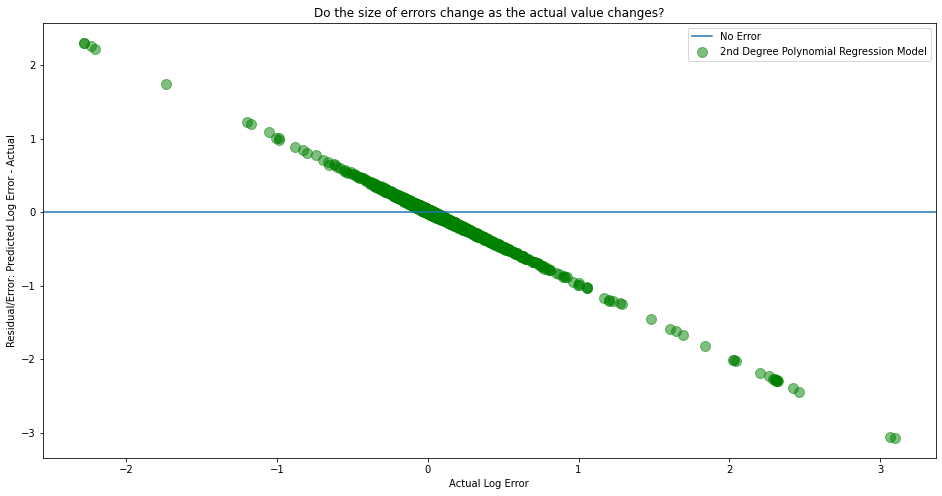

In [58]:
# plot the residuals for the best performing model

plt.figure(figsize=(16,8))
plt.axhline(label="No Error")

plt.scatter(y_validate.logerror, y_validate.le_pred_pm - y_validate.logerror, 
            alpha=.5, color="green", s=100, label="2nd Degree Polynomial Regression Model")
plt.legend()
plt.xlabel("Actual Log Error")
plt.ylabel("Residual/Error: Predicted Log Error - Actual")
plt.title("Do the size of errors change as the actual value changes?")

plt.show()

- The desired outcome is to have the residuals randomly distirbuted around 0 but as visualized above, this is not the case. The residuals have a downward pattern which indicates that our model is missing something. 
- Here it looks like the residuals become more negative as the log error values increase. So the predicted value is lower than the actual value.

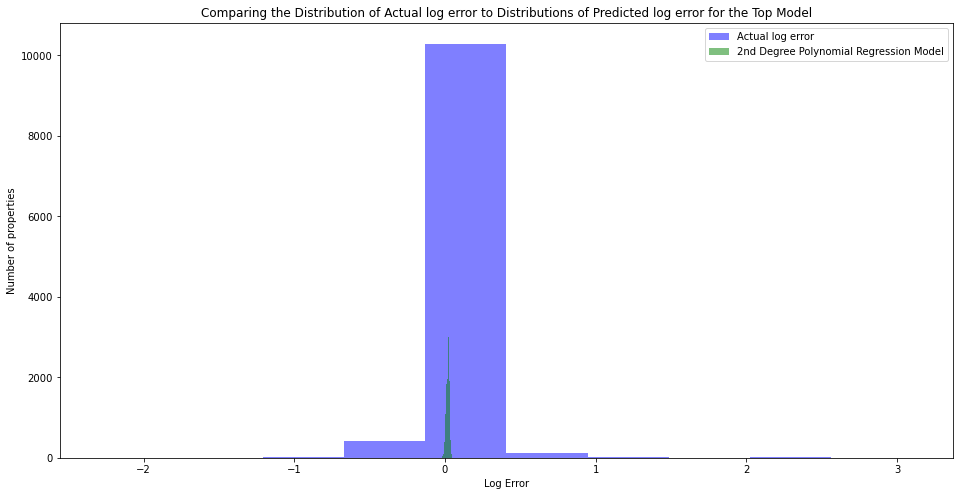

In [57]:
# plot to visualize actual vs predicted values
plt.figure(figsize=(16,8))
plt.hist(y_validate.logerror, color='blue', alpha=.5, label="Actual log error")
plt.hist(y_validate.le_pred_pm, color='green', alpha=.5, label="2nd Degree Polynomial Regression Model")
plt.xlabel("Log Error")
plt.ylabel("Number of properties")
plt.title("Comparing the Distribution of Actual log error to Distributions of Predicted log error for the Top Model")
plt.legend()
plt.show()

- As evidenced by the low R-squared value and the visualization above, our model is capturing a very limited amount of variance in log erorr.

### Conclusion

- Best drivers of log error were found to be the tax variables, location in LA county and sets of cluster 3 which contains bathroomcnt, taxvaluedollarcnt and calculatedfinishedsquarefeet
- Best performing model is the 2nd Degree Polynomial Regression Model.
- If I had more time, I would explore the creation of more clusters and possibly collect more data especially on premium propeties so as much information is not lost to outliers. 